# Explorativní analýza a zpracování dat IT Salary Survey

In [536]:
# imports
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn import preprocessing
import missingno

plt.rcParams['figure.dpi'] = 300
plt.rcParams['savefig.dpi'] = 300


## Explorativní analýza

In [537]:
def load_data(year):
    data = pd.read_csv(f"data/{year}.csv")
    data["year"] = year
    return data

d_18 = load_data(2018)
d_19 = load_data(2019)
d_20 = load_data(2020)

In [538]:
d_18.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 765 entries, 0 to 764
Data columns (total 15 columns):
 #   Column                              Non-Null Count  Dtype  
---  ------                              --------------  -----  
 0   Timestamp                           765 non-null    object 
 1   Age                                 672 non-null    float64
 2   Gender                              751 non-null    object 
 3   City                                736 non-null    object 
 4   Position                            737 non-null    object 
 5   Years of experience                 732 non-null    float64
 6   Your level                          743 non-null    object 
 7   Current Salary                      750 non-null    float64
 8   Salary one year ago                 596 non-null    float64
 9   Salary two years ago                463 non-null    float64
 10  Are you getting any Stock Options?  742 non-null    object 
 11  Main language at work               750 non-n

In [539]:
d_19.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 991 entries, 0 to 990
Data columns (total 24 columns):
 #   Column                                                                                                Non-Null Count  Dtype  
---  ------                                                                                                --------------  -----  
 0   Zeitstempel                                                                                           991 non-null    object 
 1   Age                                                                                                   882 non-null    float64
 2   Gender                                                                                                991 non-null    object 
 3   City                                                                                                  991 non-null    object 
 4   Seniority level                                                                                       97

In [540]:
d_20.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1253 entries, 0 to 1252
Data columns (total 24 columns):
 #   Column                                                                                                                   Non-Null Count  Dtype  
---  ------                                                                                                                   --------------  -----  
 0   Timestamp                                                                                                                1253 non-null   object 
 1   Age                                                                                                                      1226 non-null   float64
 2   Gender                                                                                                                   1243 non-null   object 
 3   City                                                                                                                     1253 non-null   o

Můžeme vidět, že mezi roky se otázky v průzkumu změnily, nelze tedy data spojit a provést explorativní analýzu nad všemi daty (zavedli bychom příliš mnoho nedefinovaných hodnot). Pro explorativní analýzu se nyní zaměříme na rok 2020, který je nejaktuálnější a má i nejvíce záznamů.

Přejmenujeme sloupce pro snadnější práci s nimi.

In [541]:
d_20.rename(columns={
    "Total years of experience": "TotalExperience",
    "Years of experience in Germany": "GermanyExperience",
    "Seniority level": "Seniority",
    "Your main technology / programming language": "MainTechnology",
    "Other technologies/programming languages you use often": "SecondaryTechnology",
    "Yearly brutto salary (without bonus and stocks) in EUR": "YearlySalary",
    "Yearly bonus + stocks in EUR": "YearlyBonus",
    "Annual brutto salary (without bonus and stocks) one year ago. Only answer if staying in the same country": "PreviousYearlySalary",
    "Annual bonus+stocks one year ago. Only answer if staying in same country": "PreviousYearlyBonus",
    "Number of vacation days": "VacationDays",
    "Employment status": "EmploymentStatus",
    "Сontract duration": "ContractDuration",
    "Main language at work": "MainLanguage",
    "Company size": "CompanySize",
    "Company type": "CompanyType",
    "Have you lost your job due to the coronavirus outbreak?": "LostJobInCovid",
    "Have you been forced to have a shorter working week (Kurzarbeit)? If yes, how many hours per week": "KurzarbeitHours",
    "Have you received additional monetary support from your employer due to Work From Home? If yes, how much in 2020 in EUR": "WFHSupport",
    "Position ": "Position"
}, inplace=True)

### Zjištění nekonzistencí

Některé sloupce, které by měly nabývat pouze numerických hodnot, zjevně obsahují i nečíselné hodnoty, neboť jim byl přiřazen typ object. Zjistíme, jaké hodnoty bude nutné vyčistit.

**Numerické atributy**

In [542]:
def show_offenders(df, col):
    return df[pd.to_numeric(df[col].str.replace(',', '.'), errors='coerce').isnull()][col].value_counts()

show_offenders(d_20, "TotalExperience")

1 (as QA Engineer) / 11 in total                       1
15, thereof 8 as CTO                                   1
6 (not as a data scientist, but as a lab scientist)    1
less than year                                         1
Name: TotalExperience, dtype: int64

In [543]:
show_offenders(d_20, "GermanyExperience")

< 1                                                    1
4 (in Switzerland), 0 (in Germany)                     1
4 month                                                1
3 months                                               1
3 (in Poland)                                          1
<1                                                     1
⁰                                                      1
-                                                      1
6 (not as a data scientist, but as a lab scientist)    1
less than year                                         1
Name: GermanyExperience, dtype: int64

YearlySalary a PreviousYearlySalary jsou čisté.

In [544]:
show_offenders(d_20, "YearlyBonus")

bvg only    1
depends     1
15000+-     1
Na          1
-           1
Not sure    1
Name: YearlyBonus, dtype: int64

In [545]:
show_offenders(d_20, "PreviousYearlyBonus")

learning budget, bvg, gym, food    1
-                                  1
Name: PreviousYearlyBonus, dtype: int64

In [546]:
show_offenders(d_20, "VacationDays")

unlimited                                       3
unlimited                                       2
Unlimited                                       2
(no idea)                                       1
30 in contract (but theoretically unlimited)    1
Unlimited                                       1
~25                                             1
23+                                             1
24 labour days                                  1
Name: VacationDays, dtype: int64

KurzarbeitHours je čistý.

In [547]:
show_offenders(d_20, "WFHSupport")

No                                                         33
no                                                          7
180€                                                        1
400 / month                                                 1
yes                                                         1
75% from government                                         1
40 every month                                              1
200 Amazon voucher                                          1
-                                                           1
600 nett                                                    1
20%                                                         1
I was able to move all equipment I need to work to home     1
Name: WFHSupport, dtype: int64

**Kategorické atributy**

In [548]:
d_20["Seniority"].value_counts()

Senior                                       565
Middle                                       366
Lead                                         166
Junior                                        79
Head                                          44
Principal                                      3
student                                        1
Intern                                         1
Entry level                                    1
Working Student                                1
C-Level                                        1
no idea, there are no ranges in the firm       1
Student                                        1
intern                                         1
Key                                            1
C-level executive manager                      1
Director                                       1
No level                                       1
CTO                                            1
Work Center Manager                            1
Manager             

In [549]:
d_20["EmploymentStatus"].value_counts()

Full-time employee                                                                 1190
Self-employed (freelancer)                                                           28
Part-time employee                                                                    8
Founder                                                                               3
Company Director                                                                      1
working student                                                                       1
Working Student                                                                       1
Full-time position, part-time position, & self-employed (freelancing, tutoring)       1
Intern                                                                                1
full-time, but 32 hours per week (it was my request, I'm a student)                   1
Werkstudent                                                                           1
Name: EmploymentStatus, dtype: i

In [550]:
d_20["LostJobInCovid"].value_counts()

No                                                                                        1162
Yes                                                                                         63
i didn't but will be looking for new one because of covid                                    1
kurzarbeitzeit for 1.5 months                                                                1
Have been a freelancer at the beginning of year                                              1
No, but there was a salary cut at 10% for 3 months and then at 5% for further 3 months       1
Lost the job but for different reason                                                        1
Leads and project inquiries have slowed down                                                 1
Laid off for a bit                                                                           1
yes but found a new one with better pay / perks                                              1
Name: LostJobInCovid, dtype: int64

In [551]:
d_20["MainTechnology"].value_counts()

Java                 184
Python               164
PHP                   56
C++                   38
JavaScript            34
                    ... 
Go, PHP, SQL           1
Kotlin                 1
Jira                   1
Qml                    1
consumer analysis      1
Name: MainTechnology, Length: 256, dtype: int64

In [552]:
d_20["Gender"].value_counts()

Male       1049
Female      192
Diverse       2
Name: Gender, dtype: int64

In [553]:
d_20["City"].value_counts()

Berlin         681
Munich         236
Frankfurt       44
Hamburg         40
Stuttgart       26
              ... 
Nuremberg        1
Lübeck           1
Malta            1
Dresden          1
Saarbrücken      1
Name: City, Length: 119, dtype: int64

In [554]:
d_20["Position"].value_counts()

Software Engineer            387
Backend Developer            174
Data Scientist               110
Frontend Developer            89
QA Engineer                   71
                            ... 
Testautomation                 1
Recruiter                      1
DBA                            1
DB developer/Data analyst      1
IT Operations Manager          1
Name: Position, Length: 148, dtype: int64

### Čištění dat

Některé sloupce jsou značně nekonzistentní (řetězce v jinak číselném sloupci), nejprve tedy uděláme základní čištění a přípravu dat pro prvotní analýzu.

In [555]:
import re

# Add correct types
d_20["Timestamp"] = pd.Series(d_20["Timestamp"], dtype='datetime64[s]')
categoric = ("Gender", "Position", "Seniority", "EmploymentStatus", "ContractDuration", "CompanySize", "CompanyType", "LostJobInCovid")
for col in categoric:
    d_20[col] = d_20[col].astype("category")

# Convert bad values
d_20["TotalExperience"].replace(
    {
        "1 (as QA Engineer) / 11 in total": "11",
        "15, thereof 8 as CTO": "15",
        "6 (not as a data scientist, but as a lab scientist)": "6",
        "less than year": "0",
    }, inplace=True)
d_20["TotalExperience"].replace(re.compile(r"(\d+),(\d+)"), "\\1.\\2", inplace=True)
d_20["TotalExperience"] = d_20["TotalExperience"].astype(float)

d_20["GermanyExperience"].replace(
    {
        "< 1": "0",
        "4 (in Switzerland), 0 (in Germany)": "0",
        "4 month": "0",
        "3 months": "0",
        "3 (in Poland)": "0",
        "⁰": "0",
        "<1": "0",
        "6 (not as a data scientist, but as a lab scientist)": "6",
        "less than year": "0",
        "-": np.nan
    }, inplace=True
)
d_20["GermanyExperience"].replace(re.compile(r"(\d+),(\d+)"), "\\1.\\2", inplace=True)
d_20["GermanyExperience"] = d_20["GermanyExperience"].astype(float)

d_20["Seniority"].replace(
    {
        "No level": np.nan,
        "No level ": np.nan,
        "no idea, there are no ranges in the firm ": np.nan,
        "intern": "Intern",
        "student": "Student",
        "Working Student": "Student",
        "Entry level": "Junior",
        "C-Level": "Manager",
        "C-level executive manager": "Manager",
        "Work Center Manager": "Manager",
        "VP": "Manager",
        "Director": "Manager",
        "Key": "Manager",
        "CTO": "Manager",
        "Principal": "Manager"
    }, inplace=True
)

bonus_replacer = {
        "-": np.nan,
        "Not sure": np.nan,
        "Na": np.nan,
        "depends": np.nan,
        "bvg only": np.nan,
        "15000+-": "15000",
        # Eh, whatever, just a guesstimate
        "learning budget, bvg, gym, food": "2000"
    }
d_20["YearlyBonus"].replace(bonus_replacer, inplace=True)
d_20["YearlyBonus"] = d_20["YearlyBonus"].astype(float)
d_20["PreviousYearlyBonus"].replace(bonus_replacer, inplace=True)
d_20["PreviousYearlyBonus"] = d_20["PreviousYearlyBonus"].astype(float)

d_20["VacationDays"].replace(
    {
        "~25": "25",
        "23+": "23",
        "24 labour days": "24",
        "30 in contract (but theoretically unlimited)": "30",
        "Unlimited ": "365",
        "unlimited": "365",
        "unlimited ": "365",
        "Unlimited": "365",
        "(no idea)": np.nan,
    }, inplace=True
)
d_20["VacationDays"] = d_20["VacationDays"].astype(float)

d_20["EmploymentStatus"].replace(
    {
        "Company Directory": "Full-time employee",
        "Company Director": "Full-time employee",
        "Founder": "Full-time employee",
        "working student": "Working Student",
        "Werkstudent": "Working Student",
        "Full-time position, part-time position, & self-employed (freelancing, tutoring)": "Full-time employee",
        "full-time, but 32 hours per week (it was my request, I'm a student)": "Part-time employee"
    }, inplace=True
)

d_20["LostJobInCovid"].replace(
    {
        "i didn't but will be looking for new one because of covid": "No",
        "kurzarbeitzeit for 1.5 months": "No",
        "Have been a freelancer at the beginning of year": "No",
        "No, but there was a salary cut at 10% for 3 months and then at 5% for further 3 months": "No",
        "Lost the job but for different reason": "Yes",
        "Leads and project inquiries have slowed down": "No",
        "Laid off for a bit": "Yes",
        "yes but found a new one with better pay / perks": "Yes",
    }, inplace=True
)

d_20["WFHSupport"].replace({
    "180€": "1800",
    "No": "0",
    "no": "0",
    "400 / month": "4800",
    "yes": np.nan,
    "75% from government ": np.nan,
    "40 every month": "480",
    "200 Amazon voucher": "200",
    "-": np.nan,
    "600 nett": "600",
    "20%": np.nan,
    "I was able to move all equipment I need to work to home": "0",
    "0,00": "0"
}, inplace=True)
d_20["WFHSupport"] = d_20["WFHSupport"].astype(float)

d_20["City"].replace({"Prefer not to say": np.nan}, inplace=True)

# TODO: do more of these if necessary
d_20["MainTechnology"].replace(
    {
        "python": "Python",
        "Javascript": "JavaScript",
        "Typescript": "TypeScript",
        "kotlin": "Kotlin",
        "java": "Java",
        "Php": "PHP",
        "JavaScript/ES6": "JavaScript",
        "Js": "JavaScript",
        "none": np.nan,
        "javascript": "JavaScript",
        "sql": "SQL",
        "pythin": "Python",
        "Sql": "SQL",
        "Pyrhon": "Python",
        "JavScript": "JavaScript"
    }, inplace=True
)

### Analýza očištěných dat

In [556]:
d_20.info()
d_20

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1253 entries, 0 to 1252
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype         
---  ------                --------------  -----         
 0   Timestamp             1253 non-null   datetime64[ns]
 1   Age                   1226 non-null   float64       
 2   Gender                1243 non-null   category      
 3   City                  1252 non-null   object        
 4   Position              1247 non-null   category      
 5   TotalExperience       1237 non-null   float64       
 6   GermanyExperience     1220 non-null   float64       
 7   Seniority             1238 non-null   category      
 8   MainTechnology        1125 non-null   object        
 9   SecondaryTechnology   1096 non-null   object        
 10  YearlySalary          1253 non-null   float64       
 11  YearlyBonus           824 non-null    float64       
 12  PreviousYearlySalary  885 non-null    float64       
 13  PreviousYearlyBonu

,Timestamp,Age,Gender,City,Position,TotalExperience,GermanyExperience,Seniority,MainTechnology,SecondaryTechnology,...,VacationDays,EmploymentStatus,ContractDuration,MainLanguage,CompanySize,CompanyType,LostJobInCovid,KurzarbeitHours,WFHSupport,year
0,2020-11-24 11:14:15,26.0,Male,Munich,Software Engineer,5.0,3.0,Senior,TypeScript,"Kotlin, Javascript / Typescript",...,30.0,Full-time employee,Unlimited contract,English,51-100,Product,No,NaN,NaN,2020
1,2020-11-24 11:14:16,26.0,Male,Berlin,Backend Developer,7.0,4.0,Senior,Ruby,NaN,...,28.0,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN,NaN,2020
2,2020-11-24 11:14:21,29.0,Male,Berlin,Software Engineer,12.0,6.0,Lead,Javascript / Typescript,"Javascript / Typescript, Docker",...,30.0,Self-employed (freelancer),Temporary contract,English,101-1000,Product,Yes,NaN,NaN,2020
3,2020-11-24 11:15:24,28.0,Male,Berlin,Frontend Developer,4.0,1.0,Junior,JavaScript,NaN,...,24.0,Full-time employee,Unlimited contract,English,51-100,Startup,No,NaN,NaN,2020
4,2020-11-24 11:15:46,37.0,Male,Berlin,Backend Developer,17.0,6.0,Senior,C# .NET,".NET, SQL, AWS, Docker",...,29.0,Full-time employee,Unlimited contract,English,101-1000,Product,No,NaN,NaN,2020
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1248,2021-01-18 15:05:50,31.0,Male,Berlin,Backend Developer,9.0,5.0,Senior,Java,"Python, Javascript / Typescript, Java / Scala,...",...,26.0,Full-time employee,Unlimited contract,English,51-100,Product,Yes,NaN,NaN,2020
1249,2021-01-18 17:46:02,33.0,Male,Berlin,Researcher/ Consumer Insights Analyst,10.0,1.5,Senior,consumer analysis,NaN,...,365.0,Full-time employee,Unlimited contract,English,1000+,Product,No,NaN,0.0,2020
1250,2021-01-18 23:20:35,39.0,Male,Munich,IT Operations Manager,15.0,2.0,Lead,PHP,"Python, C/C++, Javascript / Typescript, Java /...",...,28.0,Full-time employee,Unlimited contract,English,101-1000,eCommerce,No,NaN,NaN,2020
1251,2021-01-19 10:17:58,26.0,Male,Saarbrücken,Frontend Developer,7.0,7.0,Middle,JavaScript,"Javascript / Typescript, Docker, HTML, CSS; Ad...",...,27.0,Full-time employee,Unlimited contract,German,101-1000,Product,No,NaN,0.0,2020


**Numerické atributy**

In [557]:
d_20.describe()

,Age,TotalExperience,GermanyExperience,YearlySalary,YearlyBonus,PreviousYearlySalary,PreviousYearlyBonus,VacationDays,KurzarbeitHours,WFHSupport,year
count,1226.000000,1237.000000,1220.000000,1.253000e+03,8.240000e+02,8.850000e+02,6.130000e+02,1184.000000,373.000000,458.000000,1253.0
mean,32.509788,9.057074,3.706148,8.027904e+07,6.089490e+06,6.322459e+05,1.030301e+05,30.613598,12.967828,443.946048,2020.0
std,5.663804,11.877389,3.641455,2.825061e+09,1.741825e+08,1.680508e+07,2.018889e+06,29.596261,15.275174,855.198424,0.0
min,20.000000,0.000000,0.000000,1.000100e+04,0.000000e+00,1.100000e+04,0.000000e+00,0.000000,0.000000,0.000000,2020.0
25%,29.000000,5.000000,1.000000,5.880000e+04,0.000000e+00,5.500000e+04,0.000000e+00,27.000000,0.000000,0.000000,2020.0
50%,32.000000,8.000000,3.000000,7.000000e+04,5.000000e+03,6.500000e+04,5.000000e+03,28.000000,0.000000,200.000000,2020.0
75%,35.000000,12.000000,5.000000,8.000000e+04,2.000000e+04,7.500000e+04,3.640000e+04,30.000000,30.000000,600.000000,2020.0
max,69.000000,383.000000,30.000000,1.000000e+11,5.000000e+09,5.000000e+08,5.000000e+07,365.000000,40.000000,10000.000000,2020.0


In [558]:
# Modus
d_20.mode(axis=0,numeric_only=True,dropna=True)

,Age,TotalExperience,GermanyExperience,YearlySalary,YearlyBonus,PreviousYearlySalary,PreviousYearlyBonus,VacationDays,KurzarbeitHours,WFHSupport,year
0,30.0,10.0,2.0,60000.0,0.0,65000.0,0.0,30.0,0.0,0.0,2020


In [559]:
# Mezikvartilové rozpětí
def find_iqr(x):
    return x.quantile(0.75) - x.quantile(0.25)

In [560]:
d_20.select_dtypes(include=np.number).apply(find_iqr)

Age                         6.0
TotalExperience             7.0
GermanyExperience           4.0
YearlySalary            21200.0
YearlyBonus             20000.0
PreviousYearlySalary    20000.0
PreviousYearlyBonus     36400.0
VacationDays                3.0
KurzarbeitHours            30.0
WFHSupport                600.0
year                        0.0
dtype: float64

**Kategorické atributy**

In [561]:
d_20.describe(include=["category", "object"])

,Gender,City,Position,Seniority,MainTechnology,SecondaryTechnology,EmploymentStatus,ContractDuration,MainLanguage,CompanySize,CompanyType,LostJobInCovid
count,1243,1252,1247,1238,1125,1096,1236,1224,1237,1235,1228,1233
unique,3,118,148,9,241,562,5,3,14,5,63,2
top,Male,Berlin,Software Engineer,Senior,Java,Javascript / Typescript,Full-time employee,Unlimited contract,English,1000+,Product,No
freq,1049,681,387,565,193,44,1195,1159,1020,448,760,1167


In [562]:
for x in d_20.select_dtypes(include=["category", "object"]):
    print(x + ": " + str(d_20[x].value_counts(normalize=True).max() * 100))

Gender: 84.39259855189059
City: 54.3929712460064
Position: 31.03448275862069
Seniority: 45.63812600969305
MainTechnology: 17.155555555555555
SecondaryTechnology: 4.014598540145985
EmploymentStatus: 96.68284789644012
ContractDuration: 94.68954248366013
MainLanguage: 82.4575586095392
CompanySize: 36.2753036437247
CompanyType: 61.88925081433225
LostJobInCovid: 94.64720194647201


In [563]:
print(d_20["Gender"].unique())
d_20["Gender"].value_counts()


['Male', 'Female', NaN, 'Diverse']
Categories (3, object): ['Diverse', 'Female', 'Male']


Male       1049
Female      192
Diverse       2
Name: Gender, dtype: int64

In [564]:
# Diverse category is underrepresented. 2 is not a representative sample. We will drop this category.
d_20 = d_20[d_20.Gender != "Diverse"]
d_20 = d_20.assign(Gender=d_20.Gender.cat.remove_unused_categories())

print(d_20["Gender"].unique())
d_20["Gender"].value_counts()


['Male', 'Female', NaN]
Categories (2, object): ['Female', 'Male']


Male      1049
Female     192
Name: Gender, dtype: int64

In [565]:
d_20["City"].value_counts()

Berlin         681
Munich         236
Frankfurt       44
Hamburg         39
Stuttgart       26
              ... 
Nuremberg        1
Lübeck           1
Malta            1
Dresden          1
Saarbrücken      1
Name: City, Length: 118, dtype: int64

In [566]:
d_20["Position"].value_counts().loc[lambda x: x > 40]

Software Engineer     386
Backend Developer     174
Data Scientist        110
Frontend Developer     89
QA Engineer            70
DevOps                 57
Mobile Developer       53
ML Engineer            42
Name: Position, dtype: int64

In [567]:
d_20["Seniority"].value_counts()

Senior           565
Middle           365
Lead             166
Junior            80
Head              43
Manager           11
Student            3
Intern             2
Self employed      1
Name: Seniority, dtype: int64

In [568]:
d_20["MainTechnology"].value_counts()

Java                 193
Python               192
JavaScript            76
PHP                   61
C++                   38
                    ... 
SAP BW / ABAP          1
Go, PHP, SQL           1
Kotlin                 1
Jira                   1
consumer analysis      1
Name: MainTechnology, Length: 240, dtype: int64

In [569]:
d_20["SecondaryTechnology"].value_counts()

Javascript / Typescript                                                                   44
Python                                                                                    37
SQL                                                                                       31
AWS, Docker                                                                               16
Kotlin                                                                                    15
                                                                                          ..
Python, Ruby, Java / Scala, Go, Rust, AWS, Kubernetes, Docker, Terraform, helm, packer     1
Kotlin, SQL, AWS, Kubernetes, Docker                                                       1
Python, R, Go                                                                              1
C/C++, PHP, SQL                                                                            1
Python, AWS, Kubernetes, Docker, terraform, ansible                   

Sekundární technologie jsou vskutku rozmanité, nejspíše nemá smysl je vůbec uvažovat, protože se jedná o rozsáhlý seznam v každém řádku. Oproti tomu hlavní technologie typicky mají pouze jeden jazyk/položku, mohou být tedy značně relevantnější.

In [570]:
d_20["EmploymentStatus"].value_counts()

Full-time employee            1193
Self-employed (freelancer)      28
Part-time employee               9
Working Student                  3
Intern                           1
Name: EmploymentStatus, dtype: int64

In [571]:
d_20["ContractDuration"].value_counts()

Unlimited contract    1157
Temporary contract      64
0                        1
Name: ContractDuration, dtype: int64

In [572]:
d_20["MainLanguage"].value_counts()

English               1019
German                 185
Russian                 12
Italian                  3
Spanish                  3
English and German       2
Polish                   2
Русский                  2
Czech                    2
50/50                    1
Deuglisch                1
French                   1
both                     1
Russian, English         1
Name: MainLanguage, dtype: int64

In [573]:
d_20["CompanySize"].value_counts()

1000+       446
101-1000    405
11-50       174
51-100      147
up to 10     61
Name: CompanySize, dtype: int64

In [574]:
d_20["CompanyType"].value_counts()

Product                                  758
Startup                                  252
Consulting / Agency                      142
Bank                                       5
Media                                      3
                                        ... 
IT Department of established business      1
IT-Outsourcing                             1
Industry                                   1
Automotive                                 1
service                                    1
Name: CompanyType, Length: 63, dtype: int64

In [575]:
d_20["LostJobInCovid"].value_counts()

No     1165
Yes      66
Name: LostJobInCovid, dtype: int64

#### Rozložení jednotlivých atributů

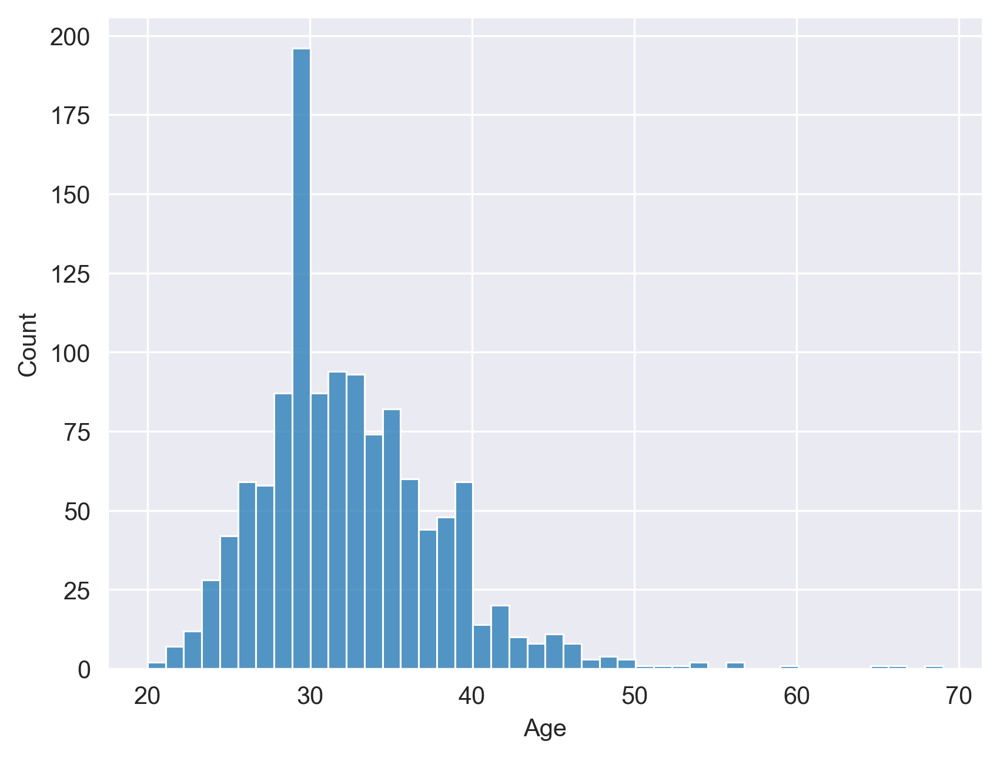

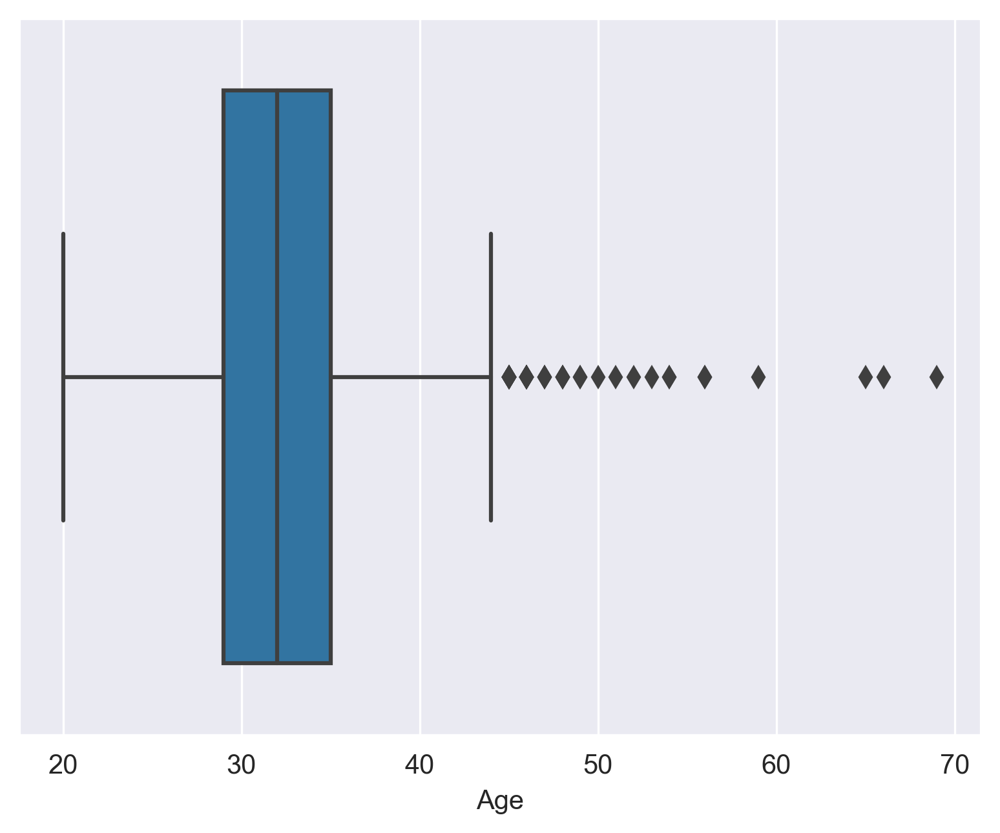

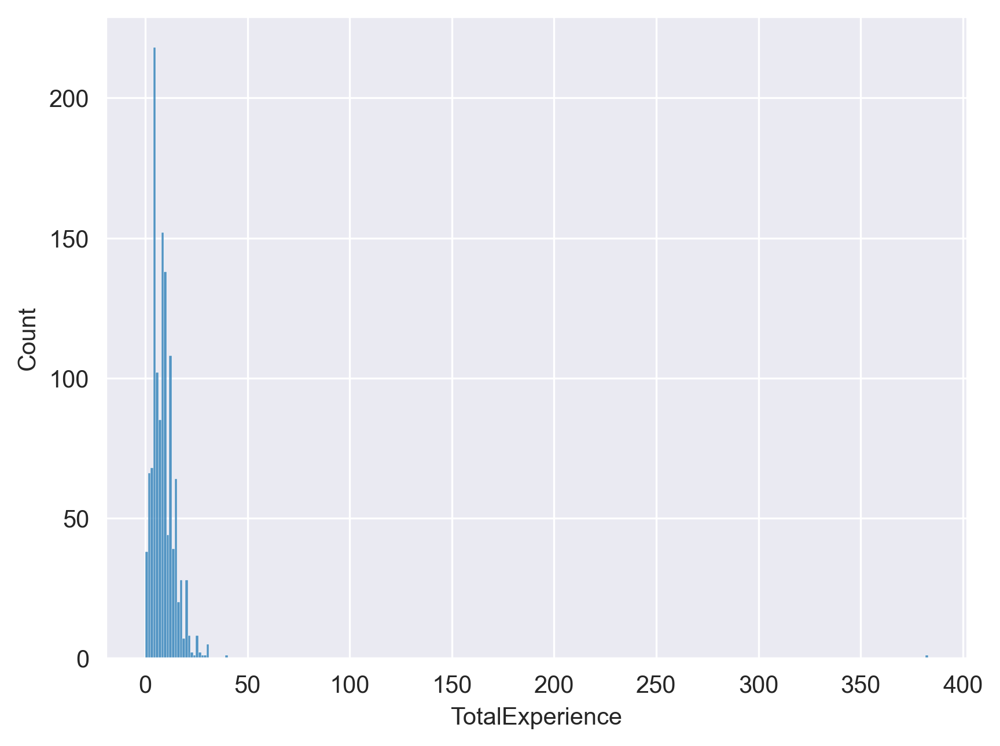

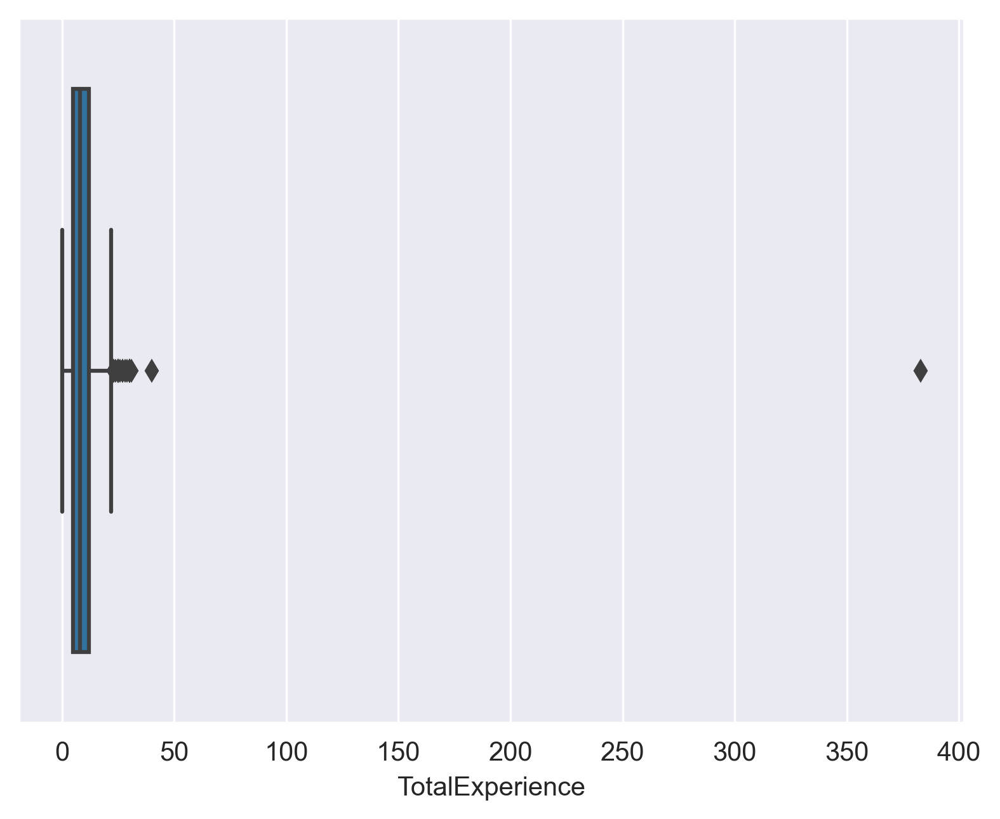

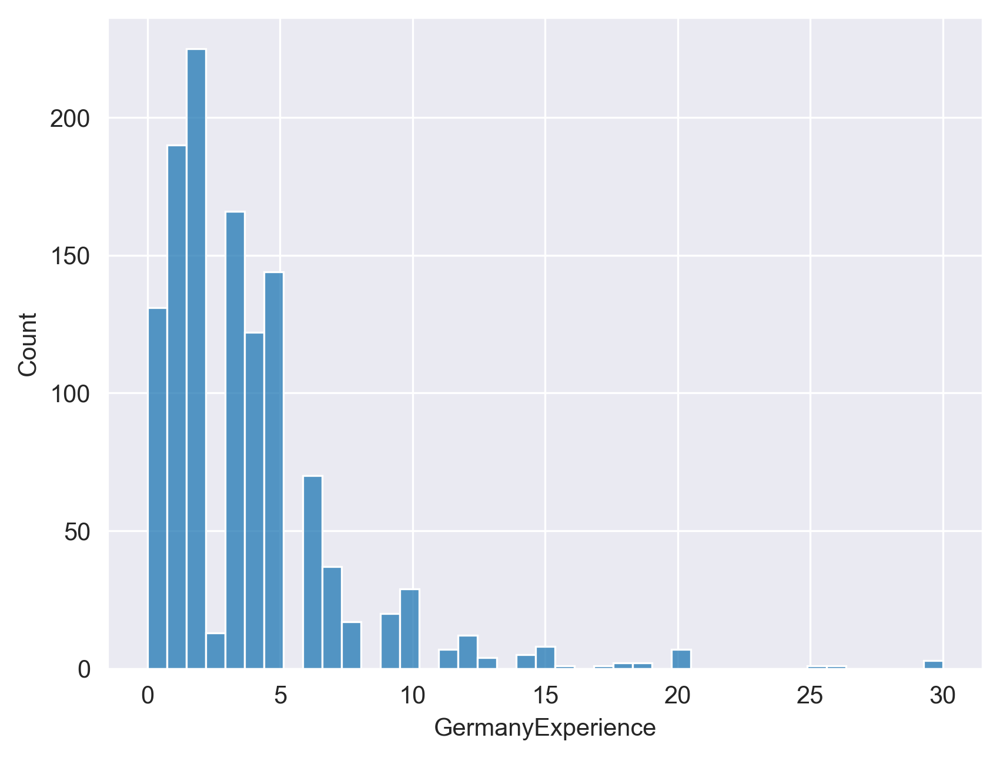

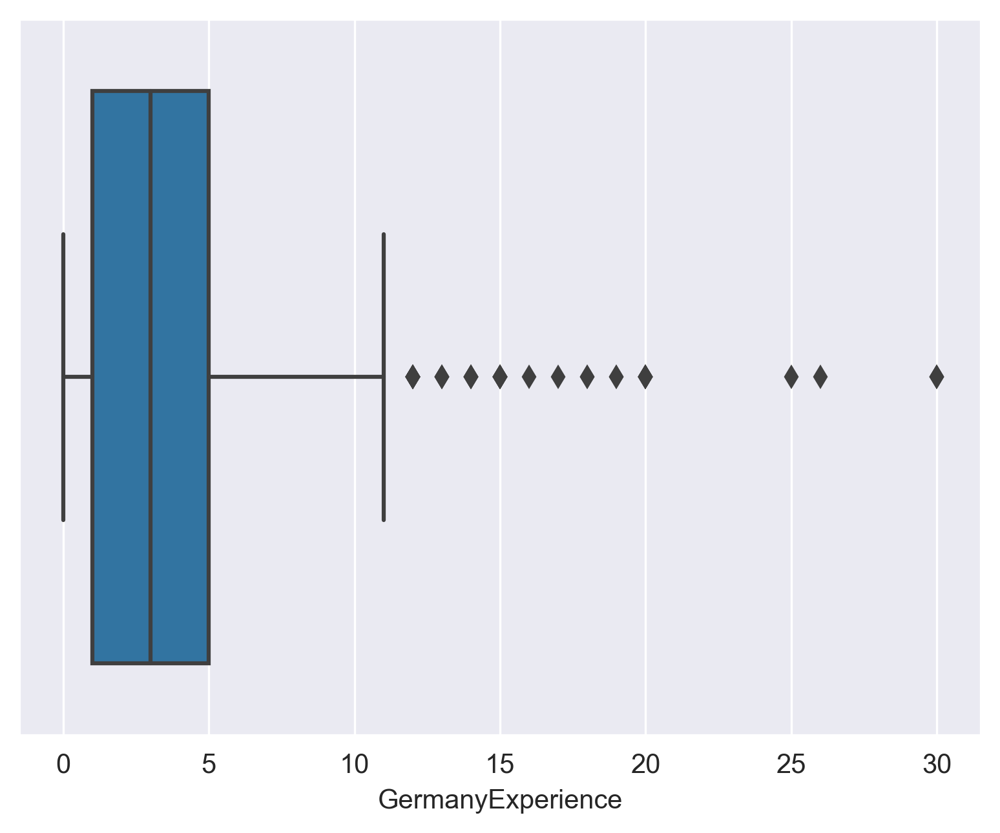

In [576]:
for attr in ("Age", "TotalExperience", "GermanyExperience"):
    ax = sns.histplot(data=d_20, x=attr)
    fig = ax.get_figure()
    fig.savefig(f"img/orig-histplot-{attr}-count.png", bbox_inches='tight')
    plt.show()
    ax = sns.boxplot(data=d_20, x=attr)
    fig = ax.get_figure()
    fig.savefig(f"img/orig-boxplot-{attr}-count.png", bbox_inches='tight')
    plt.show()

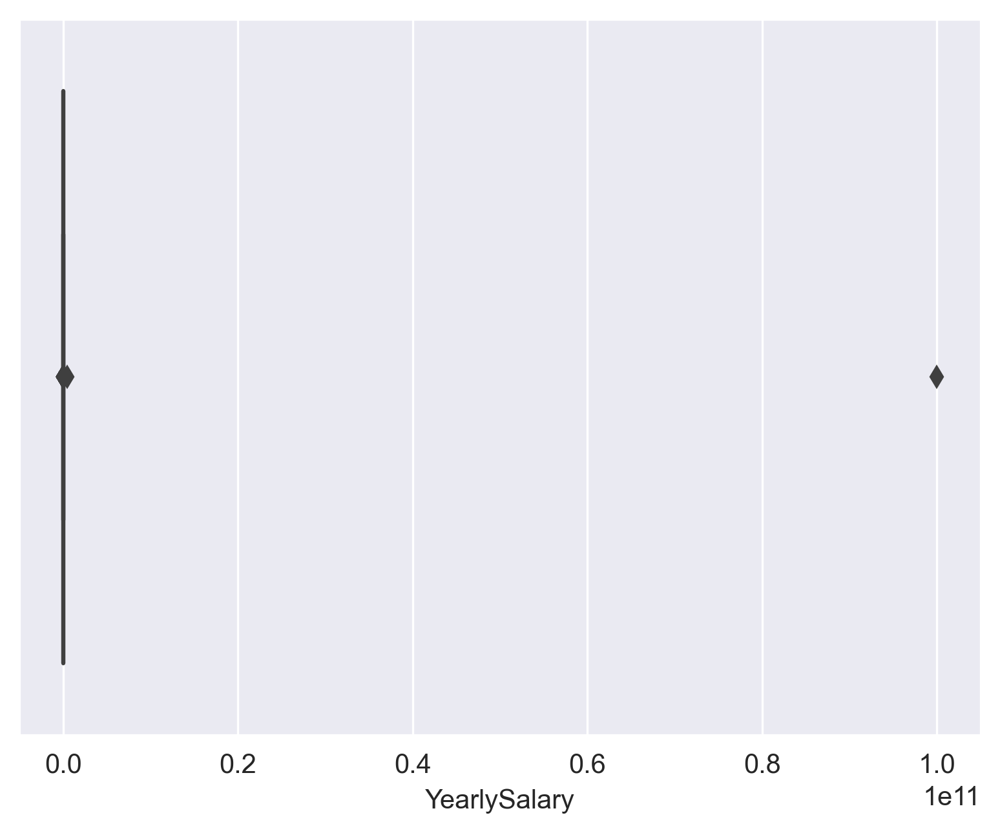

In [577]:
ax = sns.boxplot(data=d_20, x="YearlySalary")
fig = ax.get_figure()
fig.savefig(f"img/orig-boxplot-YearlySalary.png", bbox_inches='tight')


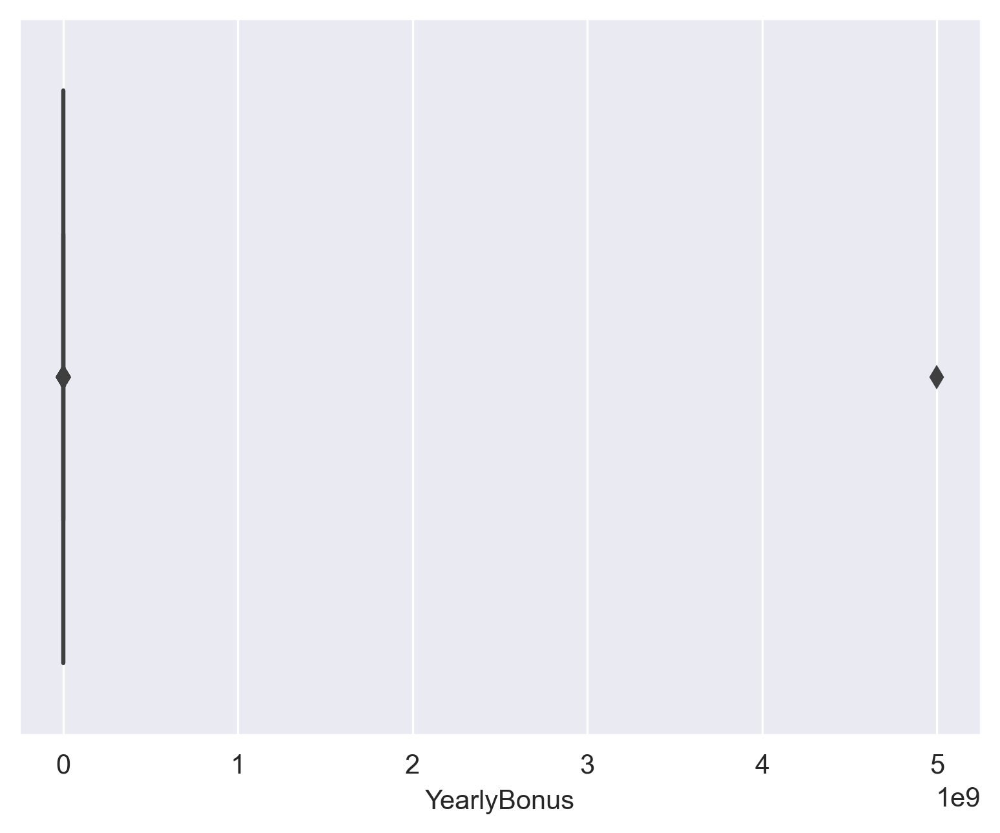

In [578]:
ax = sns.boxplot(data=d_20, x="YearlyBonus")
fig = ax.get_figure()
fig.savefig(f"img/orig-boxplot-YearlyBonus.png", bbox_inches='tight')

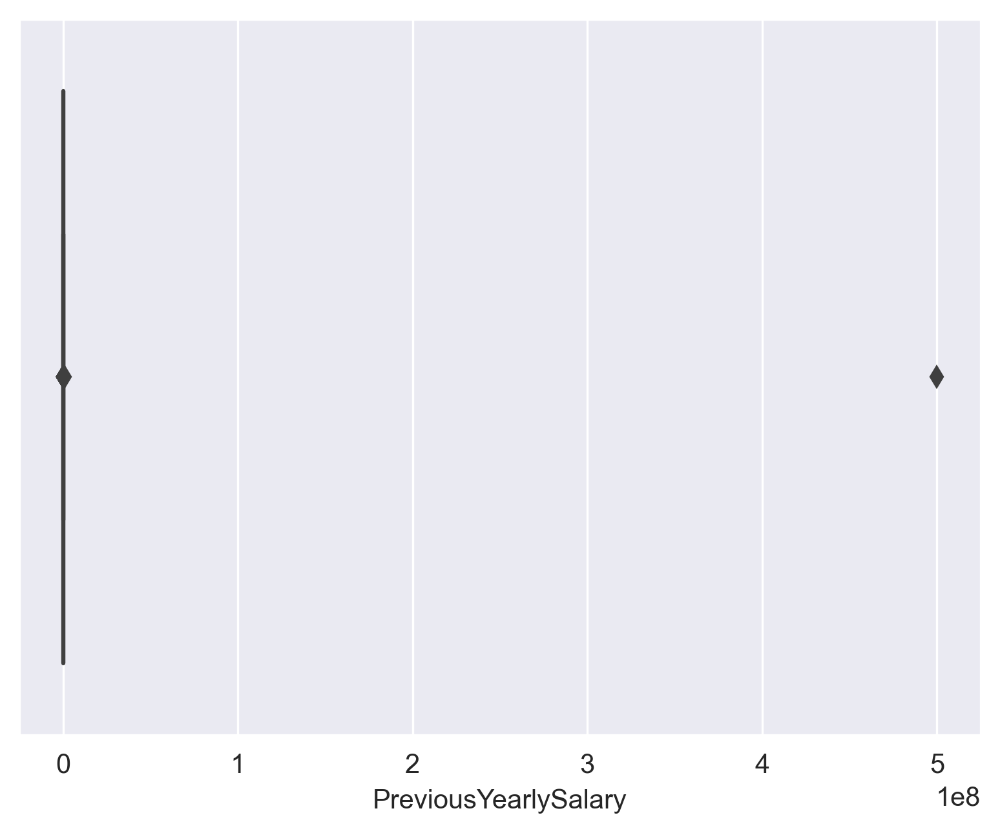

In [579]:
ax = sns.boxplot(data=d_20, x="PreviousYearlySalary")
fig = ax.get_figure()
fig.savefig(f"img/orig-boxplot-PreviousYearlySalary.png", bbox_inches='tight')

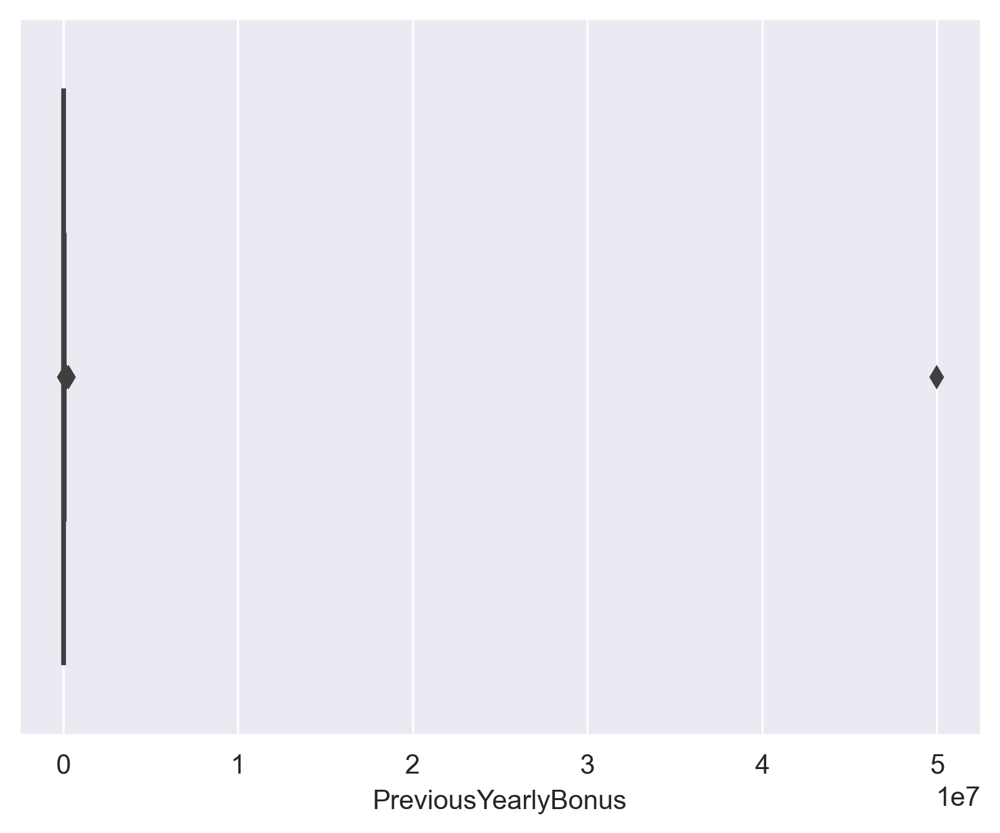

In [580]:
ax = sns.boxplot(data=d_20, x="PreviousYearlyBonus")
fig = ax.get_figure()
fig.savefig(f"img/orig-boxplot-PreviousYearlyBonus.png", bbox_inches='tight')

Můžeme nahlédnout, že atribut pro celkové množství zkušeností a roční výplatu má extrémně odlehlé hodnoty, které bude nutné vyfiltrovat.

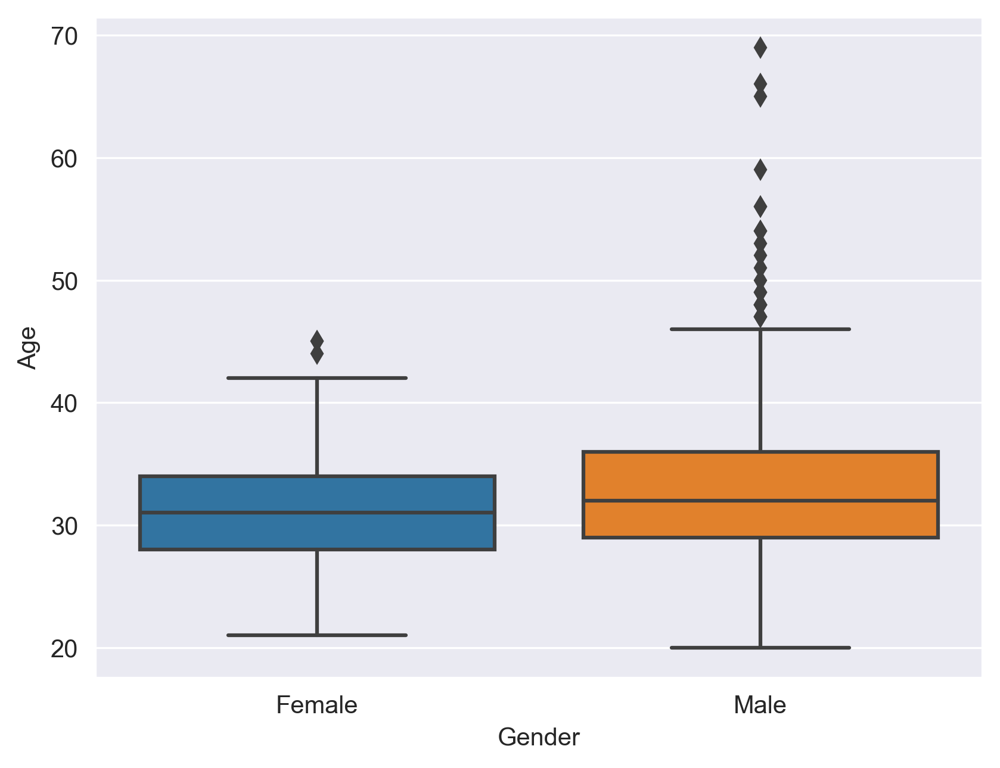

In [581]:
ax = sns.boxplot(data=d_20, x="Gender", y="Age")
fig = ax.get_figure()
fig.savefig(f"img/orig-boxplot-Gender-Age.png", bbox_inches='tight')


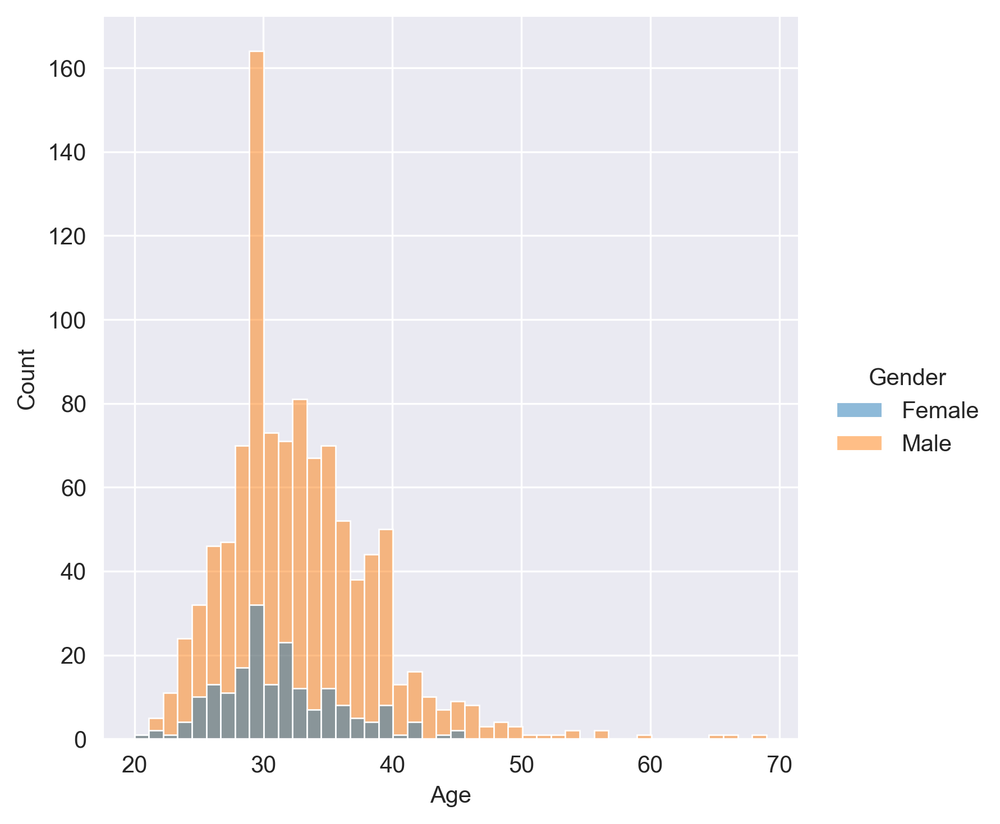

In [582]:
sns.displot(data=d_20, kind="hist", x="Age", hue="Gender")

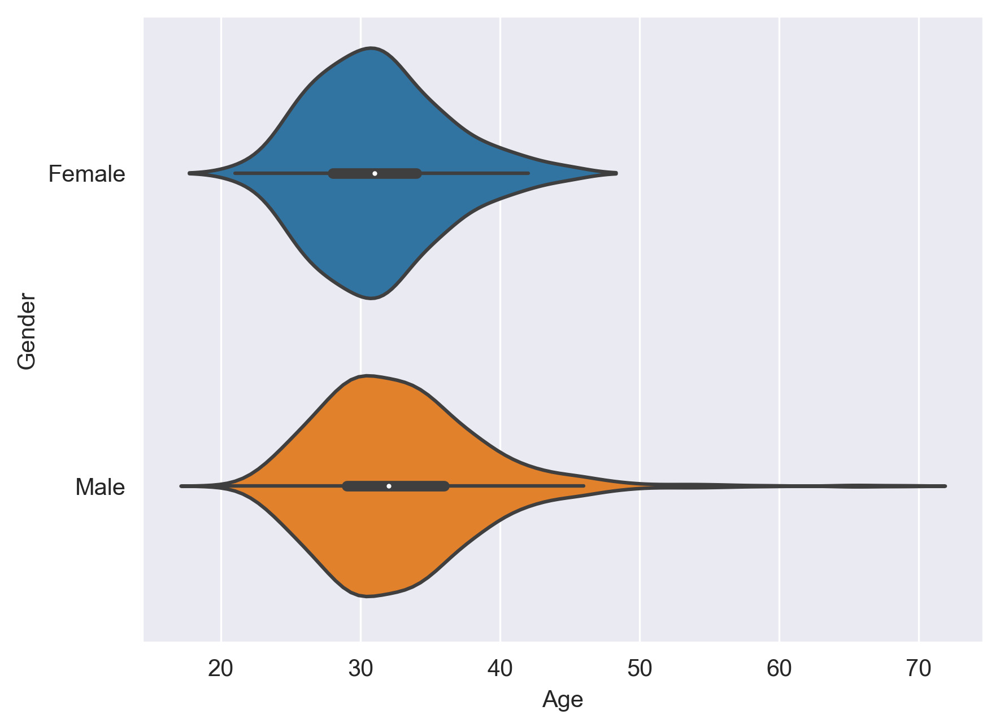

In [583]:
ax = sns.violinplot(data=d_20, x="Age", y="Gender")
fig = ax.get_figure()
fig.savefig(f"img/orig-violinplot-Age-Gender.png", bbox_inches='tight')


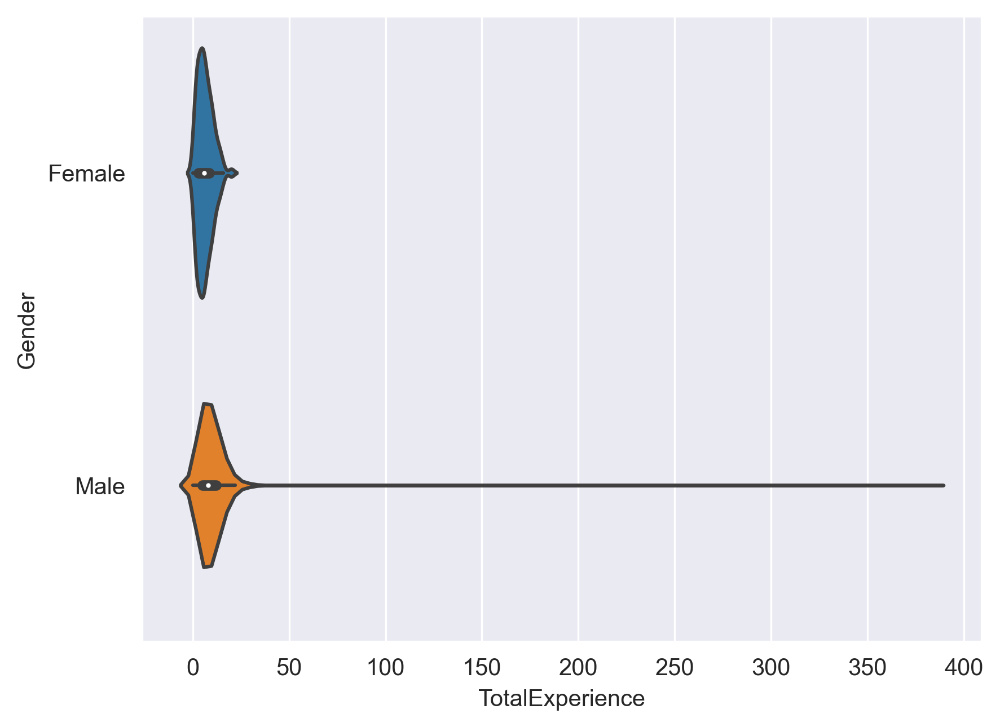

In [584]:
ax = sns.violinplot(data=d_20, x="TotalExperience", y="Gender")
fig = ax.get_figure()
fig.savefig(f"img/orig-violinplot-TotalExperience-Gender.png", bbox_inches='tight')


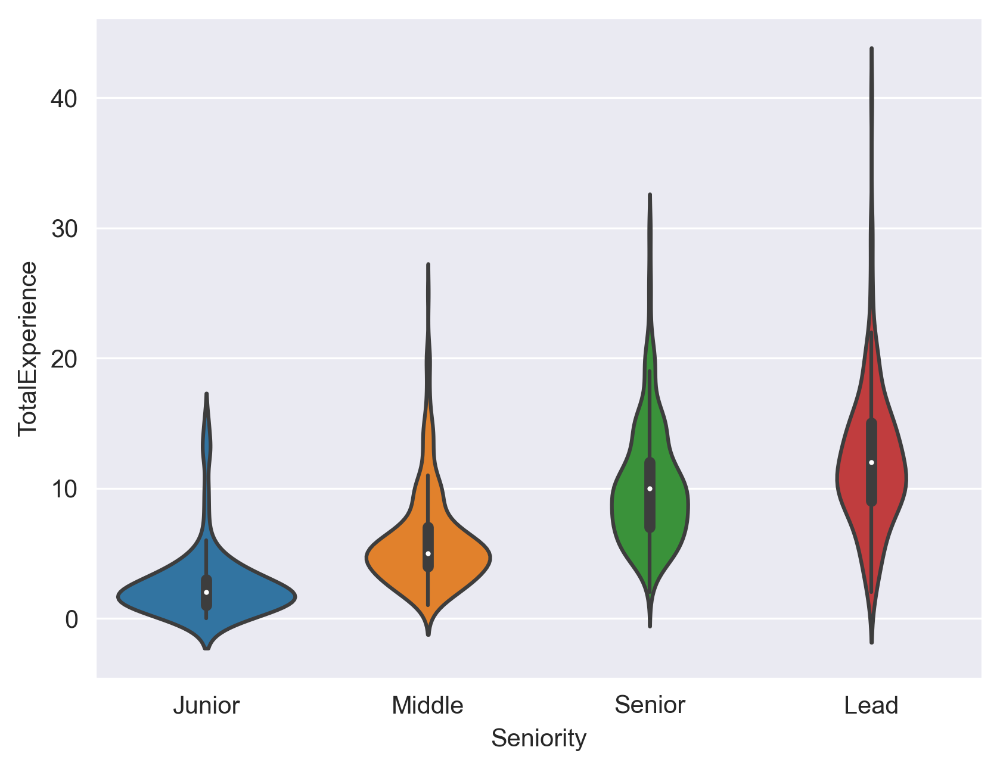

In [585]:
seniority_data = d_20.loc[d_20["Seniority"].isin(["Junior", "Middle", "Senior", "Lead"])].copy()
# Hack to remove the least common seniority levels from the violinplot
seniority_data["Seniority"] = seniority_data["Seniority"].astype(object)
ax = sns.violinplot(data=seniority_data, y="TotalExperience", x="Seniority", order=["Junior", "Middle", "Senior", "Lead"])
fig = ax.get_figure()
fig.savefig(f"img/orig-violinplot-TotalExperience-Seniority.png", bbox_inches='tight')


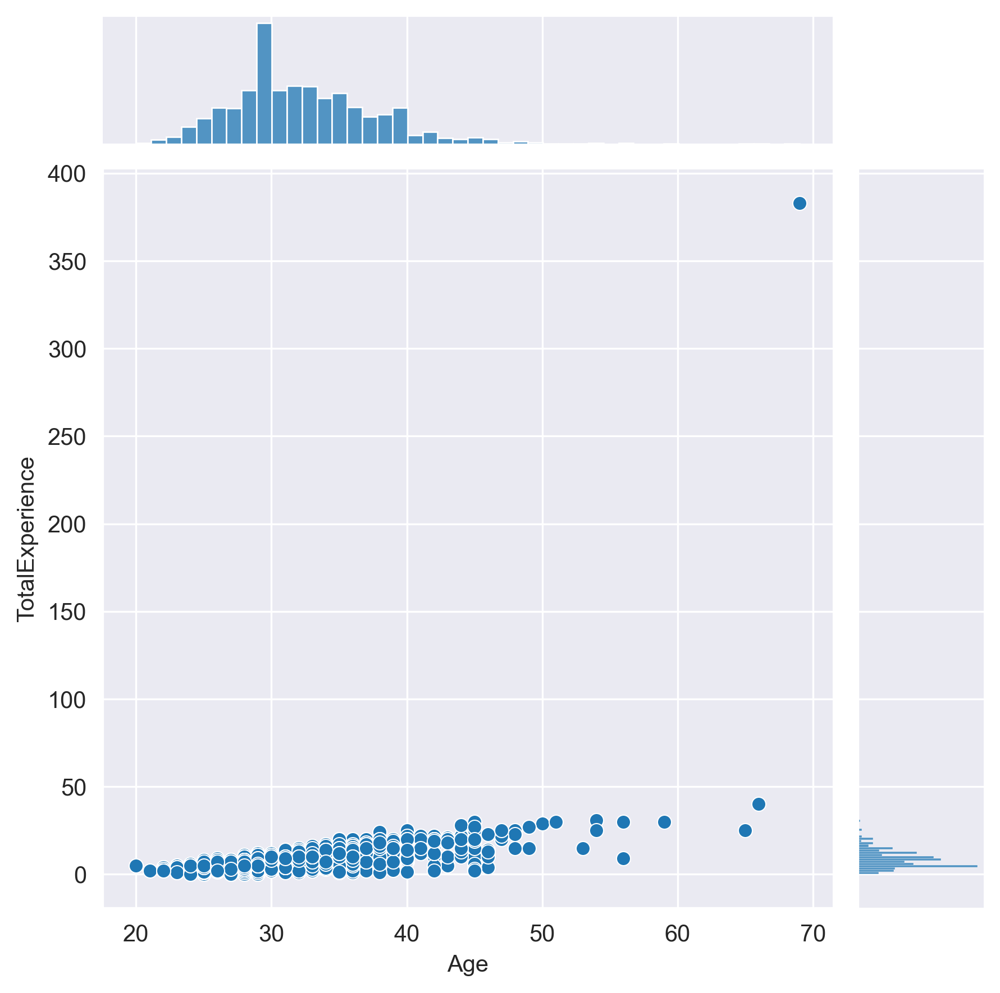

In [586]:
ax = sns.jointplot(data=d_20, x="Age", y="TotalExperience")
ax.fig.savefig(f"img/orig-jointplot-Age-TotalExperience.png", bbox_inches='tight')


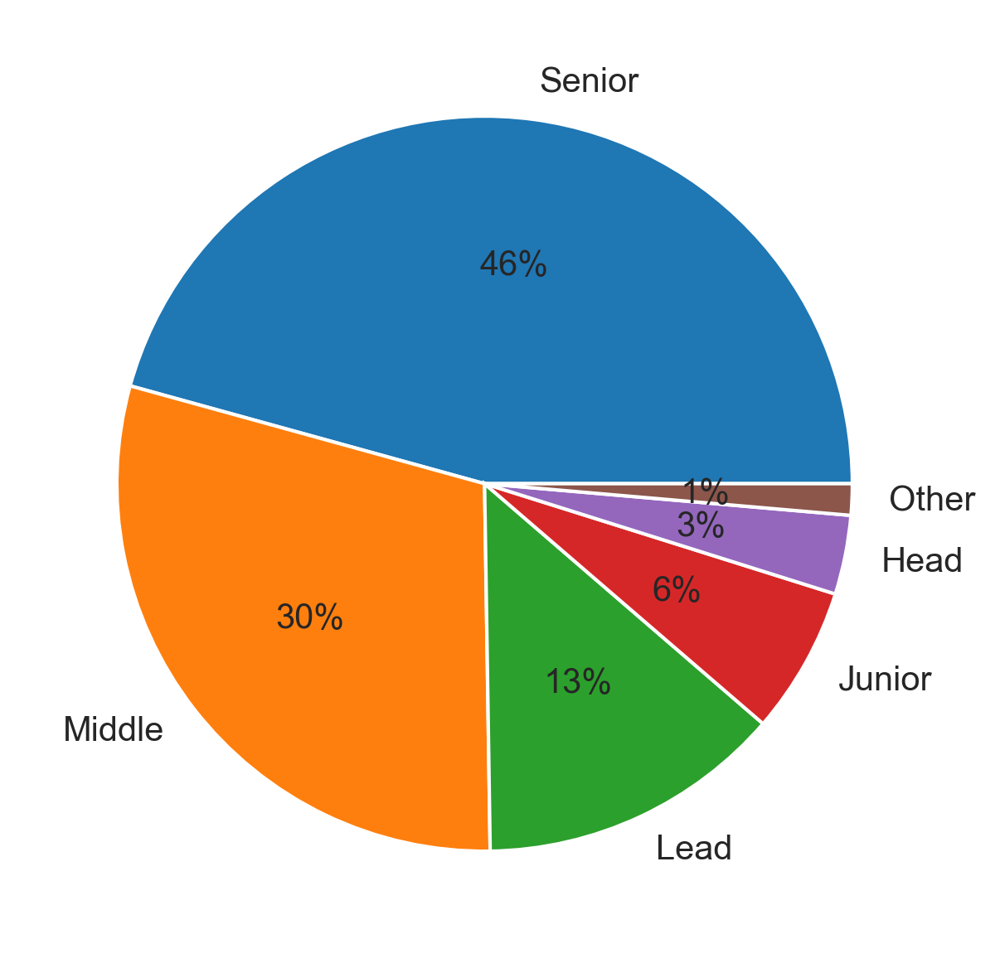

In [587]:
seniority = d_20['Seniority'].value_counts().reset_index()
BOUNDARY = 12
seniority_top = seniority[seniority["Seniority"] >= BOUNDARY].copy()
seniority_other = seniority[seniority["Seniority"] < BOUNDARY]["Seniority"].sum()
seniority_top.loc[len(seniority_top)] = ["Other", seniority_other]
seniority_top.set_index(keys=["index"], inplace=True)
ax = seniority_top["Seniority"].plot.pie(autopct="%1.0f%%")
fig = ax.get_figure()
ax.yaxis.set_visible(False)
fig.savefig(f"img/orig-pieplot-Seniority.png", bbox_inches='tight')


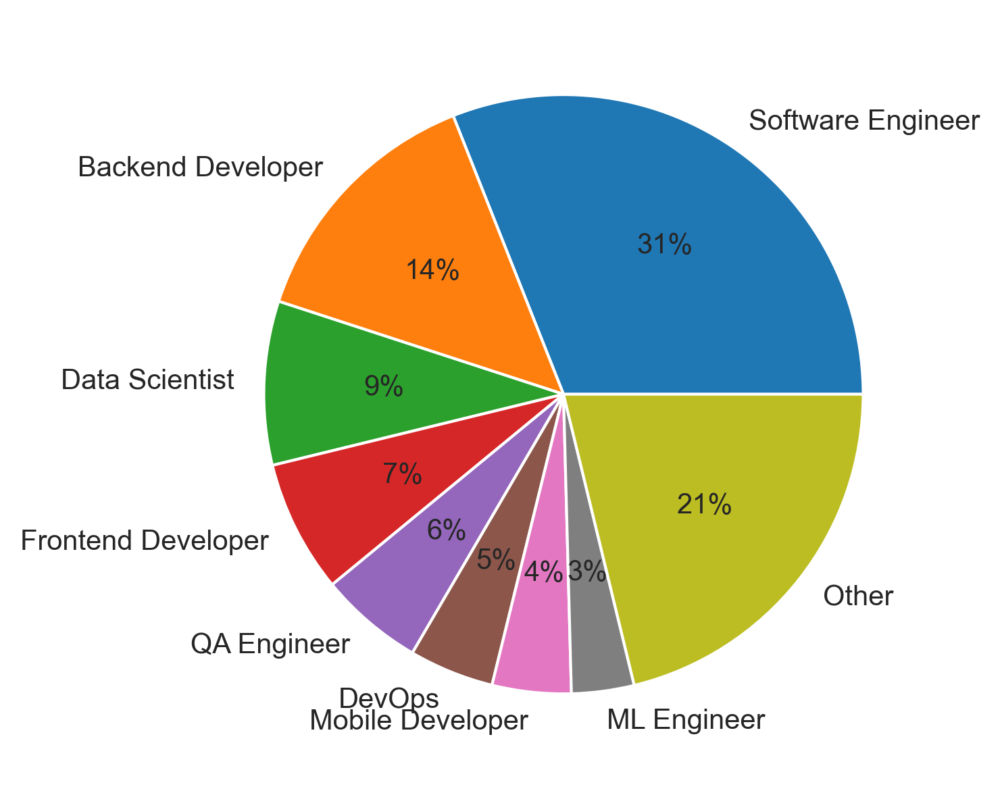

In [588]:
# Position
position = d_20['Position'].value_counts().reset_index()
BOUNDARY = 41
position_top = position[position["Position"] >= BOUNDARY].copy()
position_other = position[position["Position"] < BOUNDARY]["Position"].sum()
position_top.loc[len(position_top)] = ["Other", position_other]
position_top.set_index(keys=["index"], inplace=True)
ax = position_top["Position"].plot.pie(autopct="%1.0f%%")
ax.yaxis.set_visible(False)
fig = ax.get_figure()
fig.savefig(f"img/orig-pieplot-Position.png", bbox_inches='tight')

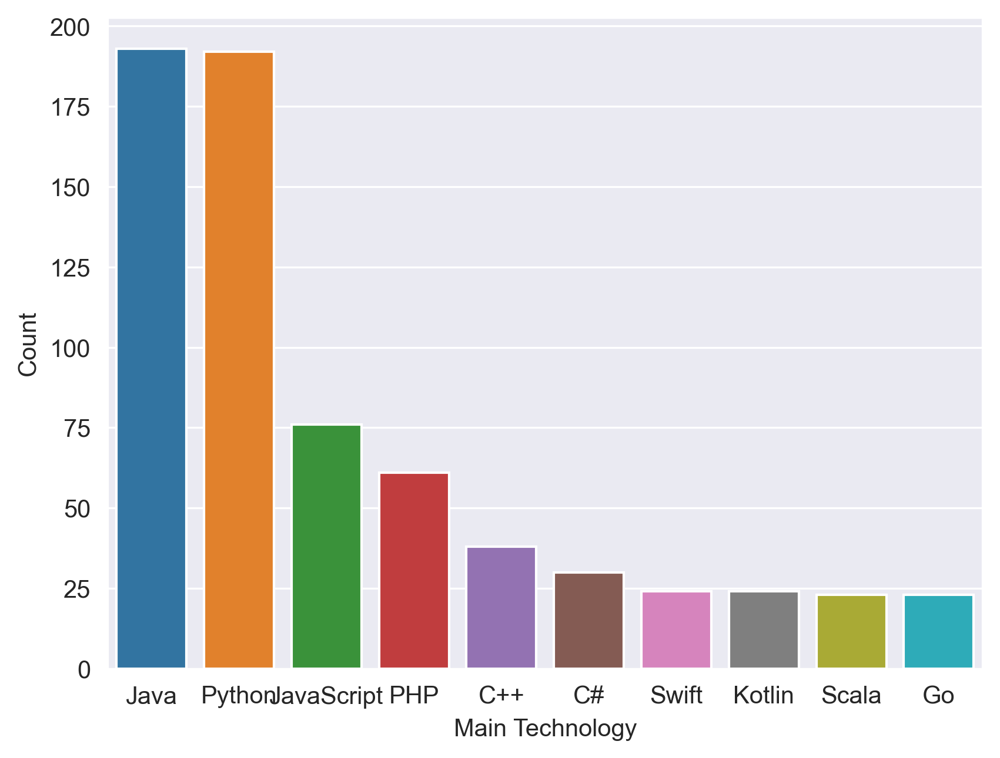

In [589]:
# Top technologies
technologies = d_20["MainTechnology"].value_counts()[:10].reset_index()
plot = sns.barplot(technologies, x="index", y="MainTechnology")
plot.set_xlabel("Main Technology")
plot.set_ylabel("Count")
ax = plot
fig = ax.get_figure()
fig.savefig(f"img/orig-barplot-index-MainTechnology.png", bbox_inches='tight')


### Analýza chybějících hodnot


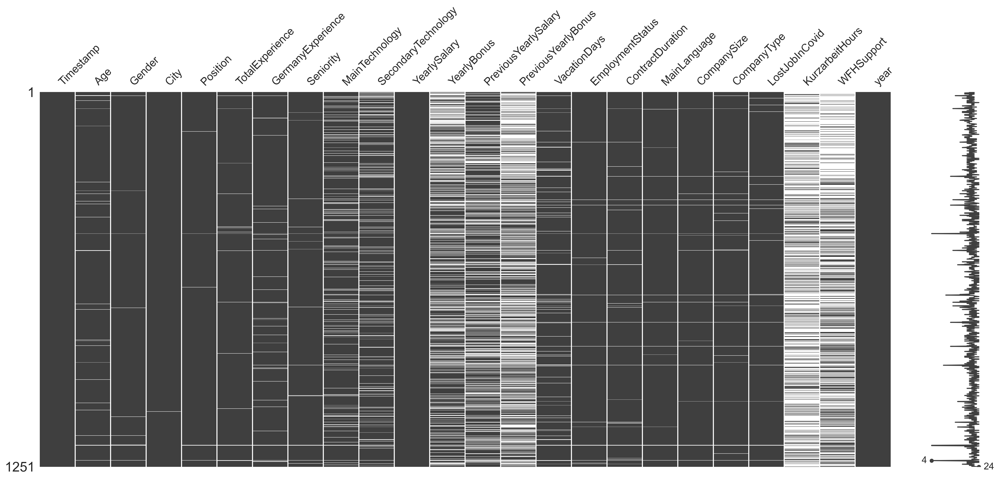

In [590]:
ax = missingno.matrix(d_20)
fig = ax.get_figure()
fig.savefig(f"img/orig-missing-matrix.png", bbox_inches='tight')


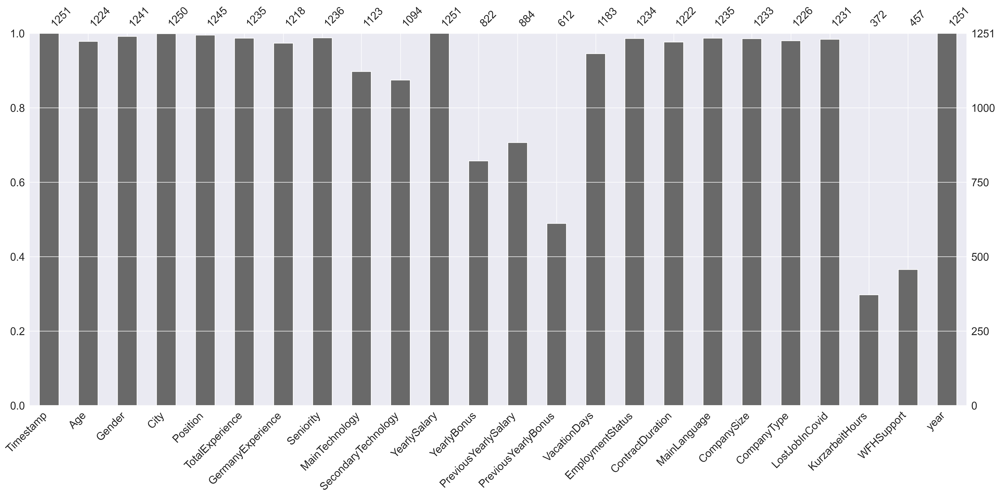

In [591]:
ax = missingno.bar(d_20)
fig = ax.get_figure()
fig.savefig(f"img/orig-missing-bar.png", bbox_inches='tight')


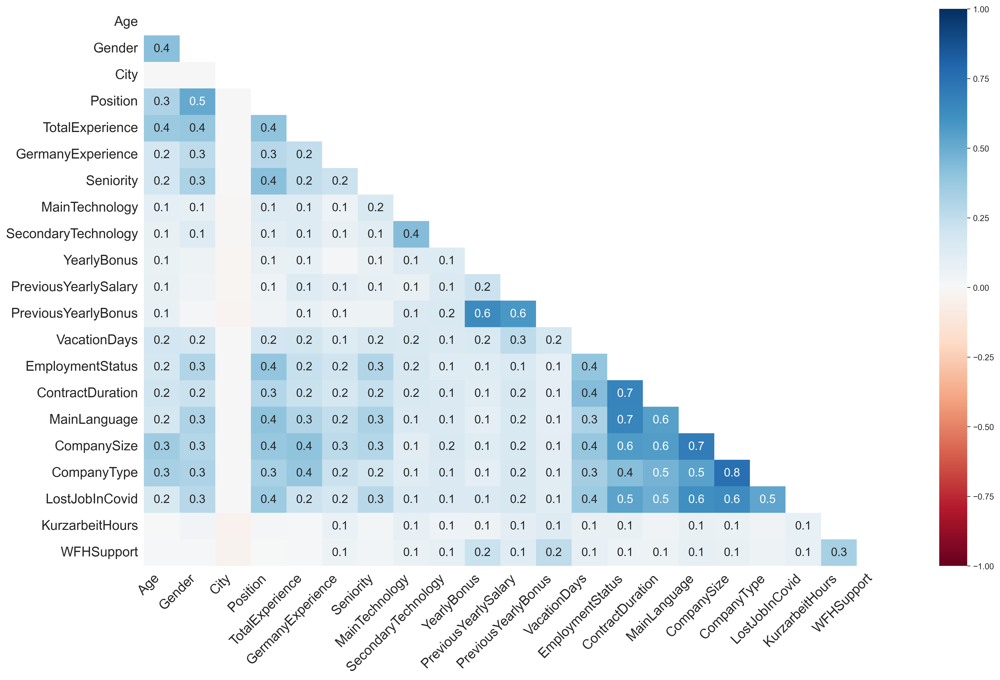

In [592]:
ax = missingno.heatmap(d_20)
fig = ax.get_figure()
fig.savefig(f"img/orig-missing-heatmap.png", bbox_inches='tight')


### Korelační analýza

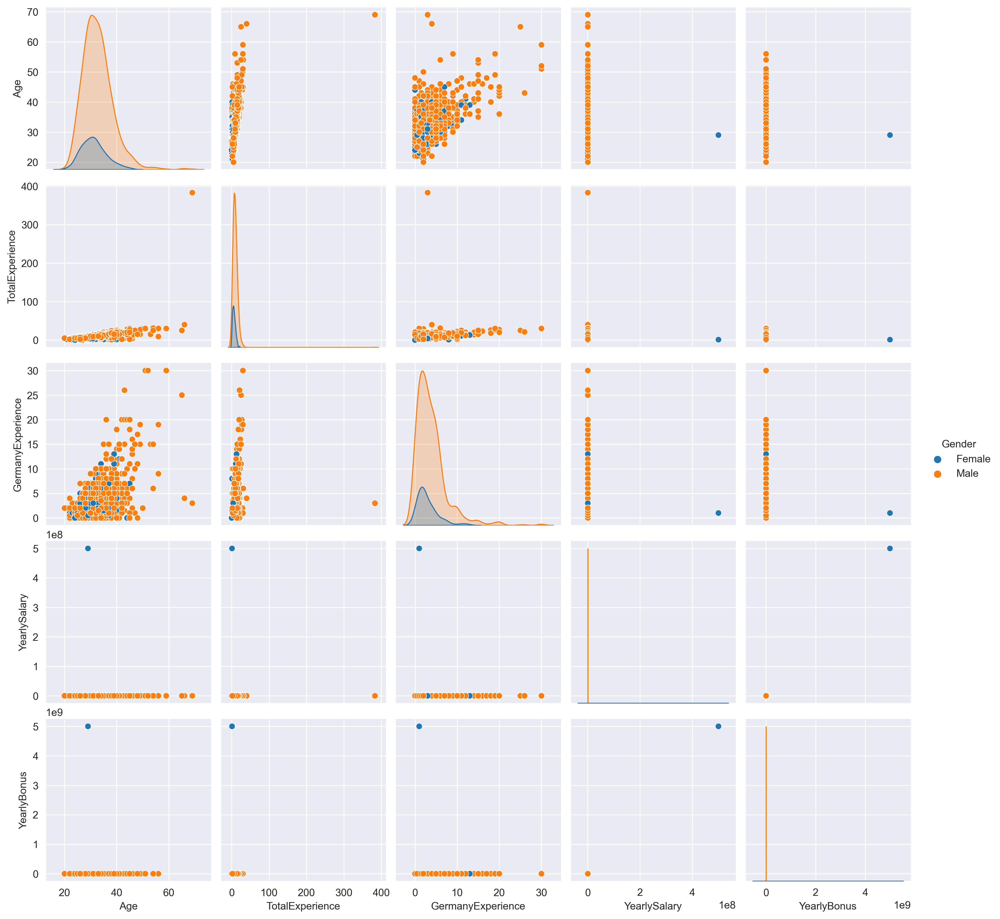

In [593]:
ax = sns.pairplot(d_20[["Age", "TotalExperience", "GermanyExperience", "YearlySalary", "Gender", "YearlyBonus"]], hue="Gender")
ax.fig.savefig(f"img/orig-pairplot-correlation.png", bbox_inches='tight')


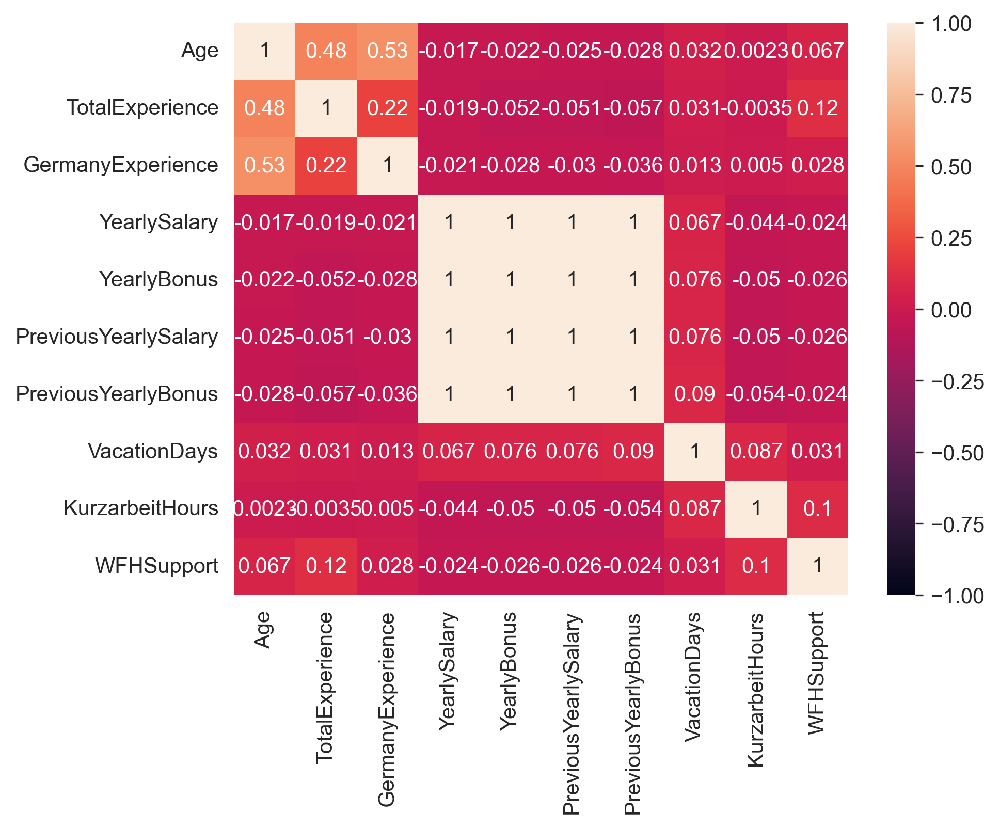

In [594]:
heatmap_data = d_20.loc[:, d_20.columns!="year"]
ax = sns.heatmap(heatmap_data.corr(numeric_only=True), vmin=-1, vmax=1, annot=True)
fig = ax.get_figure()
fig.savefig(f"img/orig-heatmap.png", bbox_inches='tight')


## Příprava pro data mining

### Výběr významných atributů

In [595]:
dataset = d_20[["Age", "Gender", "City", "Position", "TotalExperience", "GermanyExperience", "Seniority", "MainTechnology", "YearlySalary", "PreviousYearlySalary", "EmploymentStatus", "CompanySize", "CompanyType"]].copy()
dataset

,Age,Gender,City,Position,TotalExperience,GermanyExperience,Seniority,MainTechnology,YearlySalary,PreviousYearlySalary,EmploymentStatus,CompanySize,CompanyType
0,26.0,Male,Munich,Software Engineer,5.0,3.0,Senior,TypeScript,80000.0,75000.0,Full-time employee,51-100,Product
1,26.0,Male,Berlin,Backend Developer,7.0,4.0,Senior,Ruby,80000.0,82000.0,Full-time employee,101-1000,Product
2,29.0,Male,Berlin,Software Engineer,12.0,6.0,Lead,Javascript / Typescript,120000.0,100000.0,Self-employed (freelancer),101-1000,Product
3,28.0,Male,Berlin,Frontend Developer,4.0,1.0,Junior,JavaScript,54000.0,NaN,Full-time employee,51-100,Startup
4,37.0,Male,Berlin,Backend Developer,17.0,6.0,Senior,C# .NET,62000.0,62000.0,Full-time employee,101-1000,Product
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1248,31.0,Male,Berlin,Backend Developer,9.0,5.0,Senior,Java,70000.0,70000.0,Full-time employee,51-100,Product
1249,33.0,Male,Berlin,Researcher/ Consumer Insights Analyst,10.0,1.5,Senior,consumer analysis,60000.0,48000.0,Full-time employee,1000+,Product
1250,39.0,Male,Munich,IT Operations Manager,15.0,2.0,Lead,PHP,110000.0,90000.0,Full-time employee,101-1000,eCommerce
1251,26.0,Male,Saarbrücken,Frontend Developer,7.0,7.0,Middle,JavaScript,38350.0,33800.0,Full-time employee,101-1000,Product


### Odstranění odlehlých hodnot

In [596]:
for column in ("YearlySalary", "PreviousYearlySalary"):
    dataset = dataset[dataset[column] < 10**6]

for column in ("YearlySalary", "TotalExperience", "PreviousYearlySalary"):
    mean = dataset[column].mean()
    std = dataset[column].std()
    dataset = dataset[(dataset[column] <= mean + 3 * std)]
    dataset = dataset[(mean - 3 * std <= dataset[column])]
dataset.describe()

,Age,TotalExperience,GermanyExperience,YearlySalary,PreviousYearlySalary
count,847.000000,859.000000,845.000000,859.000000,859.000000
mean,32.792208,8.996857,4.126746,71720.814901,65484.629802
std,5.012211,4.903495,3.275269,19336.459711,18340.744661
min,22.000000,0.000000,0.000000,12000.000000,11000.000000
25%,29.000000,5.000000,2.000000,60000.000000,55000.000000
50%,32.000000,8.000000,3.000000,70000.000000,65000.000000
75%,36.000000,12.000000,5.000000,80000.000000,75000.000000
max,65.000000,25.000000,26.000000,156000.000000,156000.000000


### Odstranění chybějících hodnot

In [597]:
dataset = dataset.copy()
# Add missing age as mean
dataset["Age"].fillna(dataset["Age"].mean(), inplace=True)

# Drop missing gender
dataset = dataset[~dataset["Gender"].isna()]

# Assume that previous year was the same (correlation is high)
dataset["PreviousYearlySalary"].fillna(dataset["YearlySalary"], inplace=True)

# German survey -> consider NaN to be equal to total exp (some correlation)
dataset["GermanyExperience"].fillna(dataset["TotalExperience"], inplace=True)

# Assume fulltime employee
dataset["EmploymentStatus"].fillna("Full-time employee", inplace=True)

# Technology probably influences salary quite a lot, drop missing entries
dataset = dataset[~dataset["MainTechnology"].isna()]
# Only a few objects are left with data missing, we can just drop these outliers without losing power
dataset.dropna(inplace=True)
dataset

,Age,Gender,City,Position,TotalExperience,GermanyExperience,Seniority,MainTechnology,YearlySalary,PreviousYearlySalary,EmploymentStatus,CompanySize,CompanyType
0,26.0,Male,Munich,Software Engineer,5.0,3.0,Senior,TypeScript,80000.0,75000.0,Full-time employee,51-100,Product
1,26.0,Male,Berlin,Backend Developer,7.0,4.0,Senior,Ruby,80000.0,82000.0,Full-time employee,101-1000,Product
2,29.0,Male,Berlin,Software Engineer,12.0,6.0,Lead,Javascript / Typescript,120000.0,100000.0,Self-employed (freelancer),101-1000,Product
4,37.0,Male,Berlin,Backend Developer,17.0,6.0,Senior,C# .NET,62000.0,62000.0,Full-time employee,101-1000,Product
5,32.0,Male,Berlin,DevOps,5.0,1.0,Senior,"AWS, GCP, Python,K8s",76000.0,76000.0,Full-time employee,11-50,Startup
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1248,31.0,Male,Berlin,Backend Developer,9.0,5.0,Senior,Java,70000.0,70000.0,Full-time employee,51-100,Product
1249,33.0,Male,Berlin,Researcher/ Consumer Insights Analyst,10.0,1.5,Senior,consumer analysis,60000.0,48000.0,Full-time employee,1000+,Product
1250,39.0,Male,Munich,IT Operations Manager,15.0,2.0,Lead,PHP,110000.0,90000.0,Full-time employee,101-1000,eCommerce
1251,26.0,Male,Saarbrücken,Frontend Developer,7.0,7.0,Middle,JavaScript,38350.0,33800.0,Full-time employee,101-1000,Product


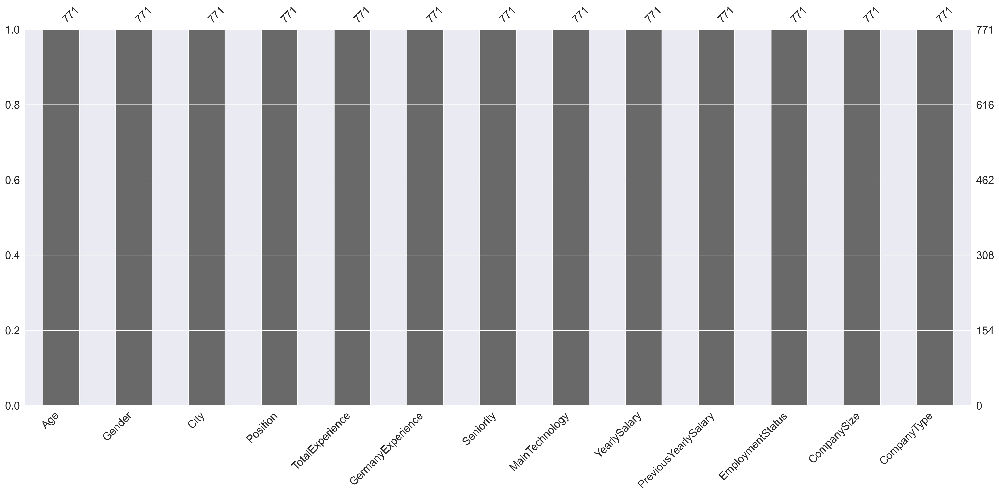

In [598]:
ax = missingno.bar(dataset)
fig = ax.get_figure()
fig.savefig(f"img/clean-missing-bar.png", bbox_inches='tight')


In [599]:
dataset.to_csv('dataset_clean.csv')

### Vytvoření grafů pro očištěnou sadu

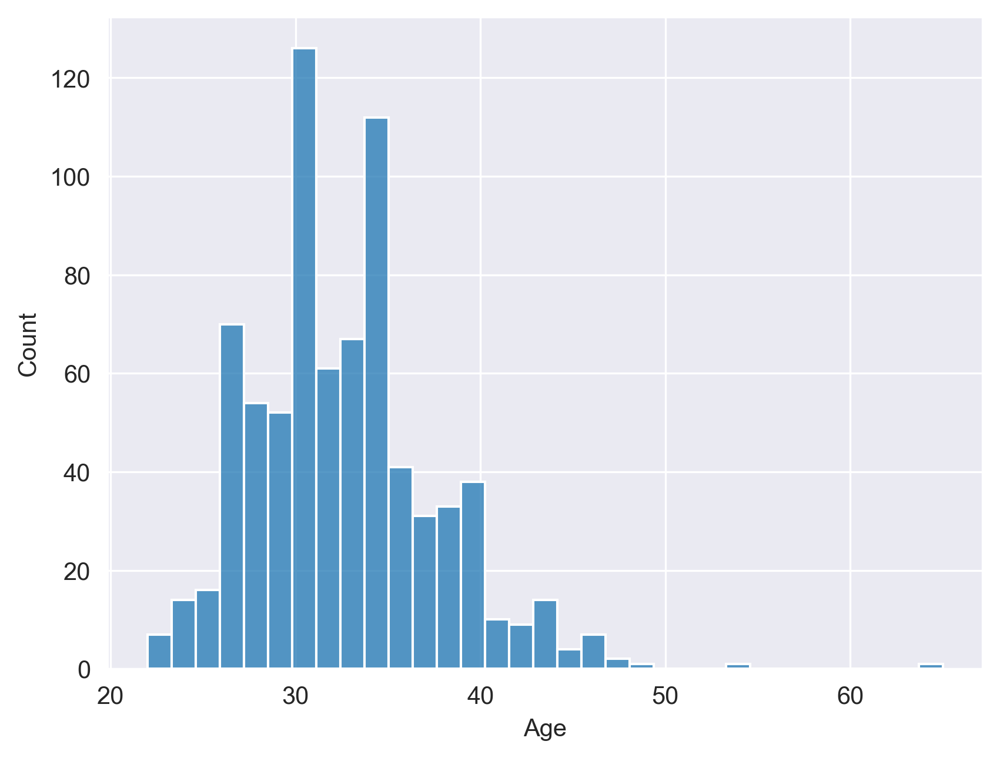

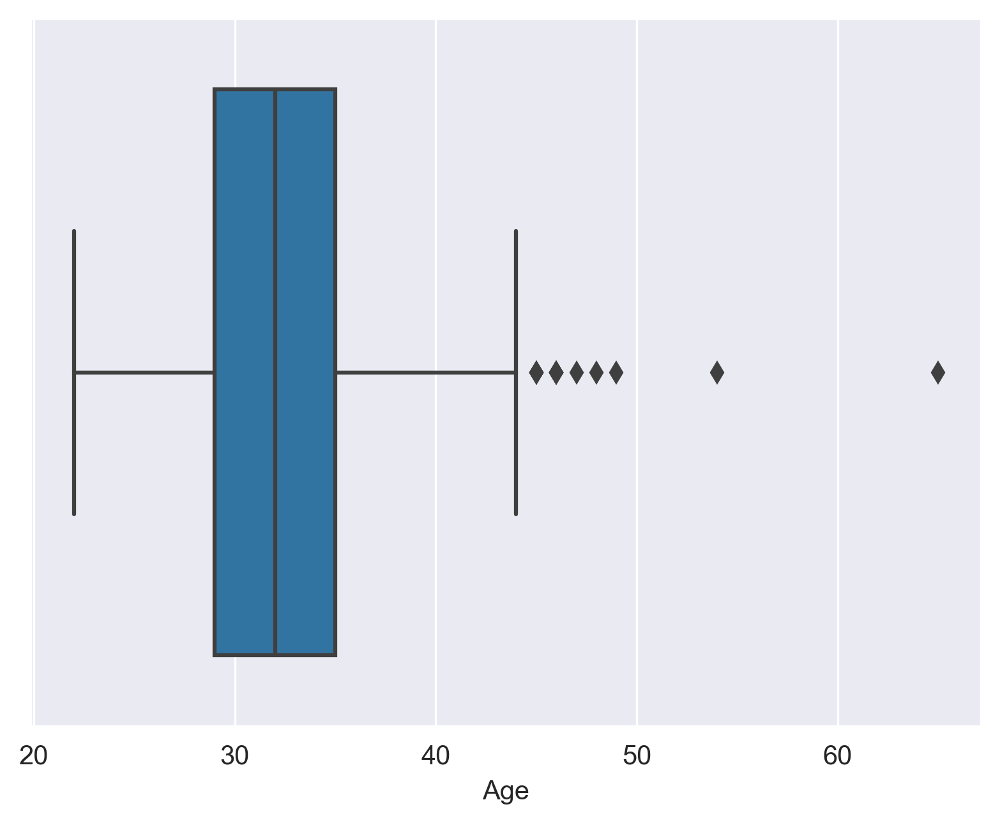

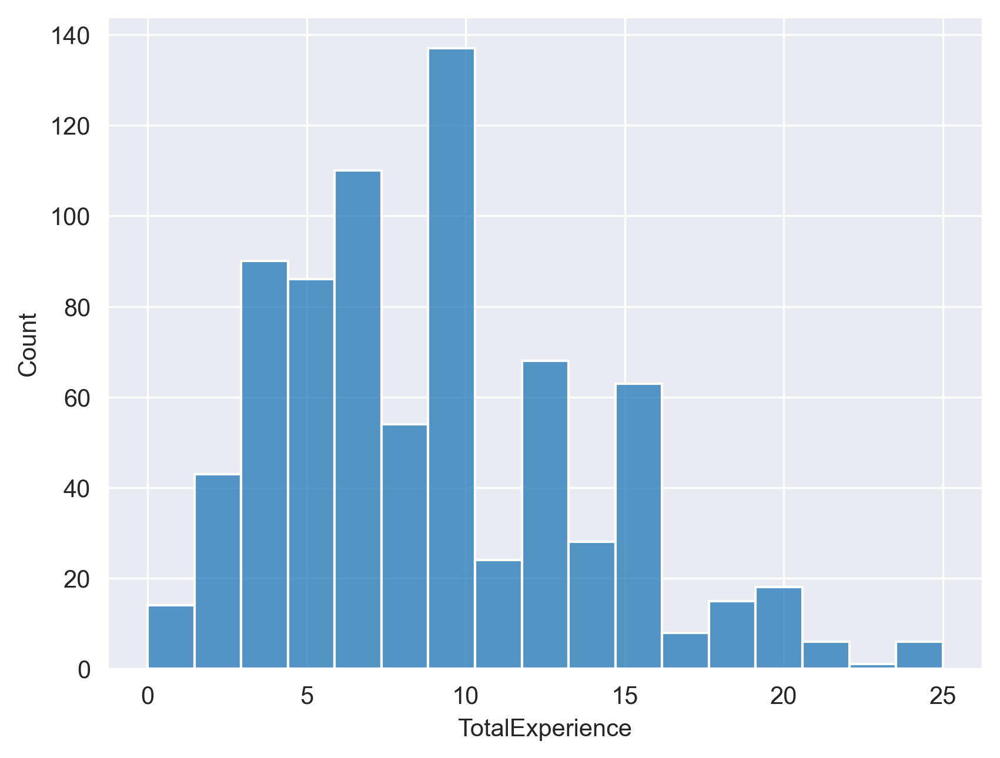

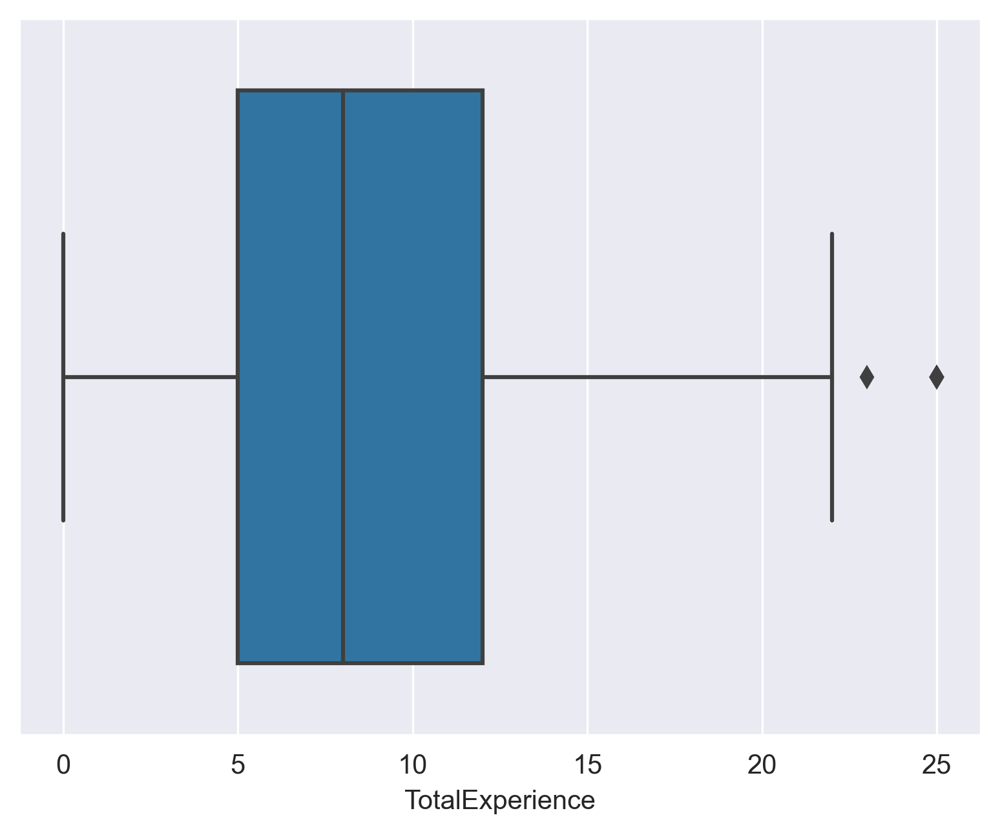

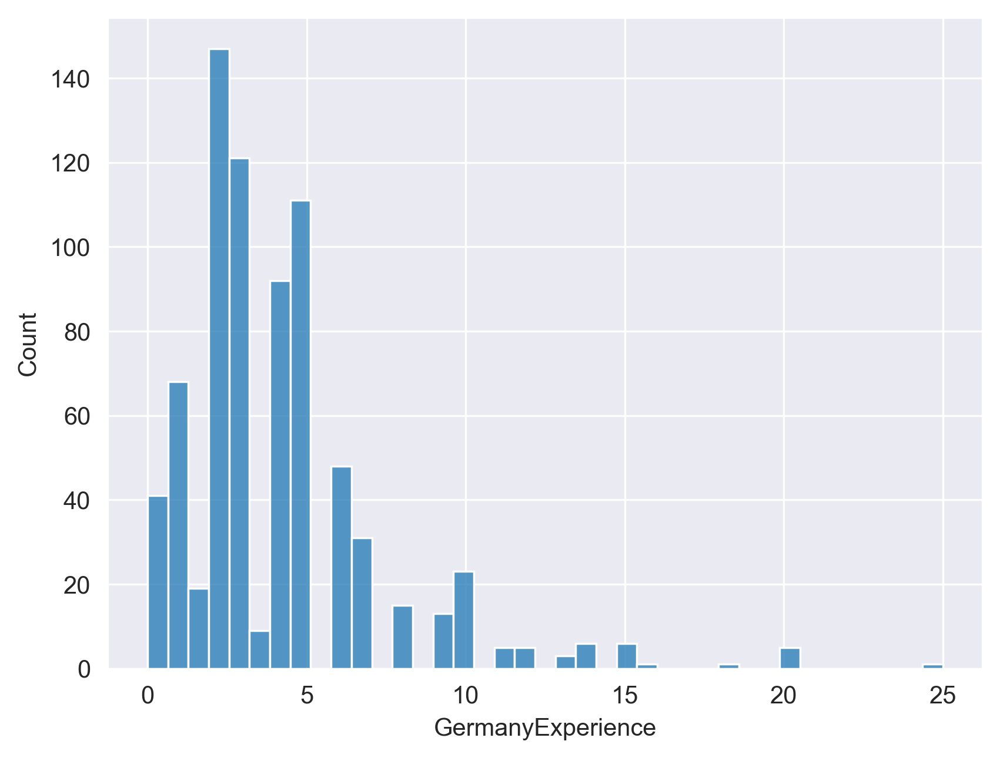

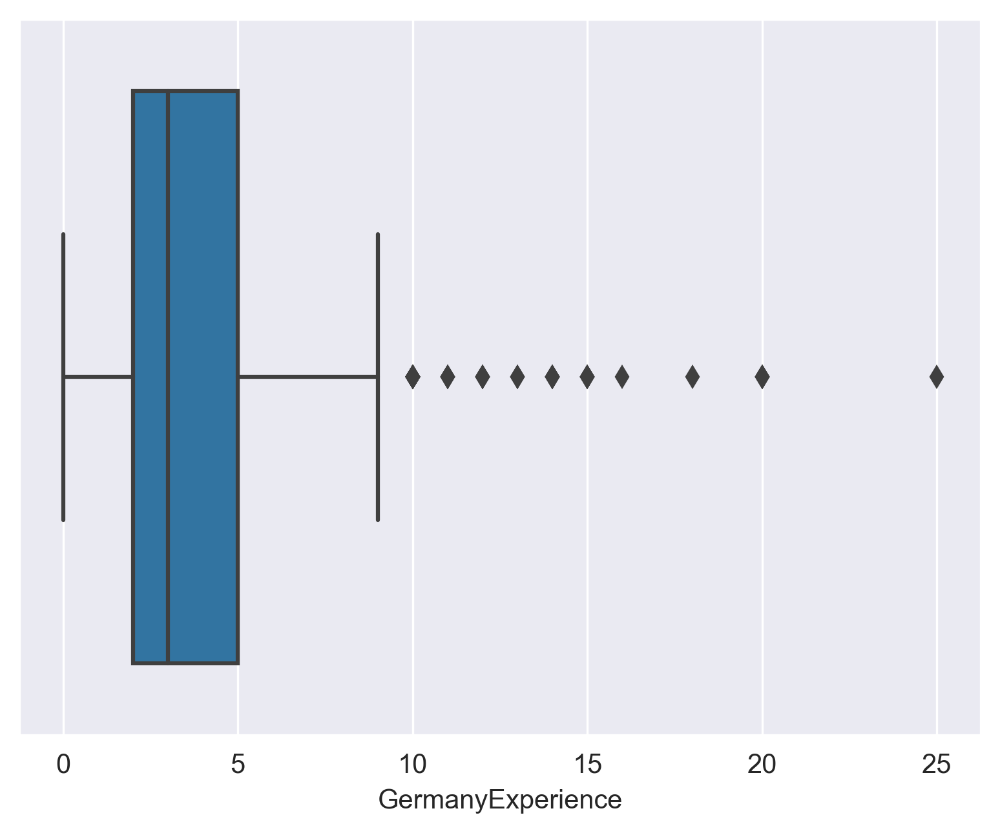

In [600]:
for attr in ("Age", "TotalExperience", "GermanyExperience"):

    ax = sns.histplot(data=dataset, x=attr)
    fig = ax.get_figure()
    fig.savefig(f"img/clean-histplot-{attr}-count.png", bbox_inches='tight')
    plt.show()
    ax = sns.boxplot(data=dataset, x=attr)
    fig = ax.get_figure()
    fig.savefig(f"img/clean-boxplot-{attr}-count.png", bbox_inches='tight')
    plt.show()


<AxesSubplot: xlabel='YearlySalary'>

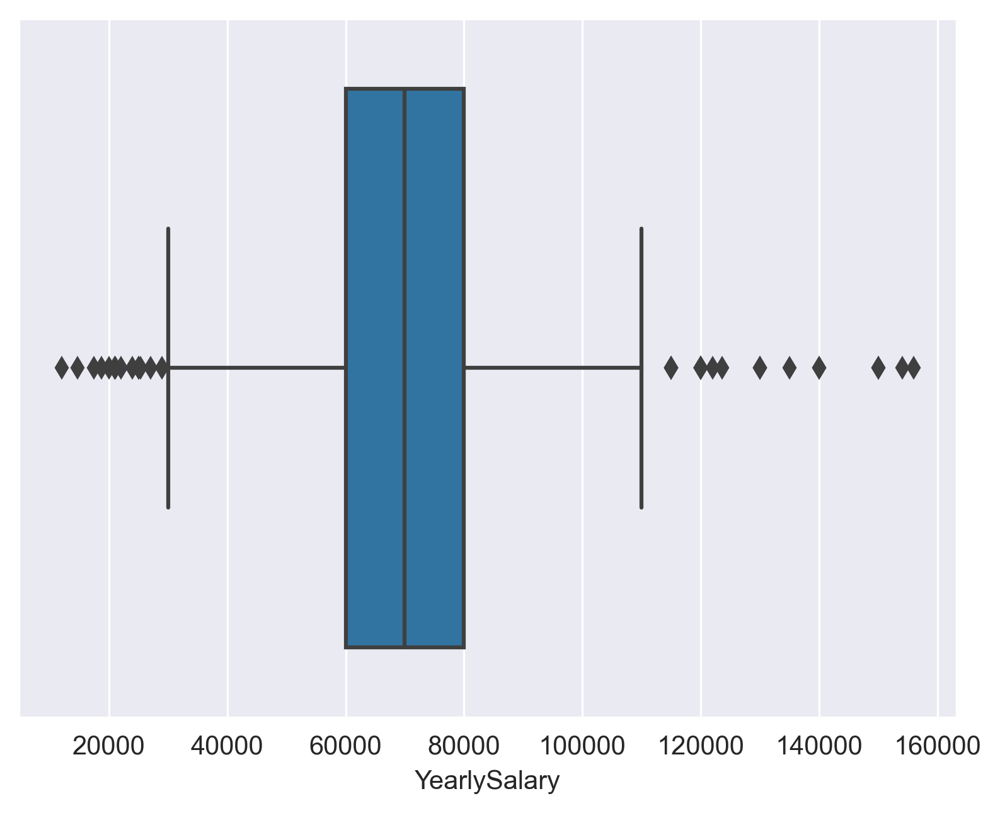

In [601]:
sns.boxplot(data=dataset, x="YearlySalary")


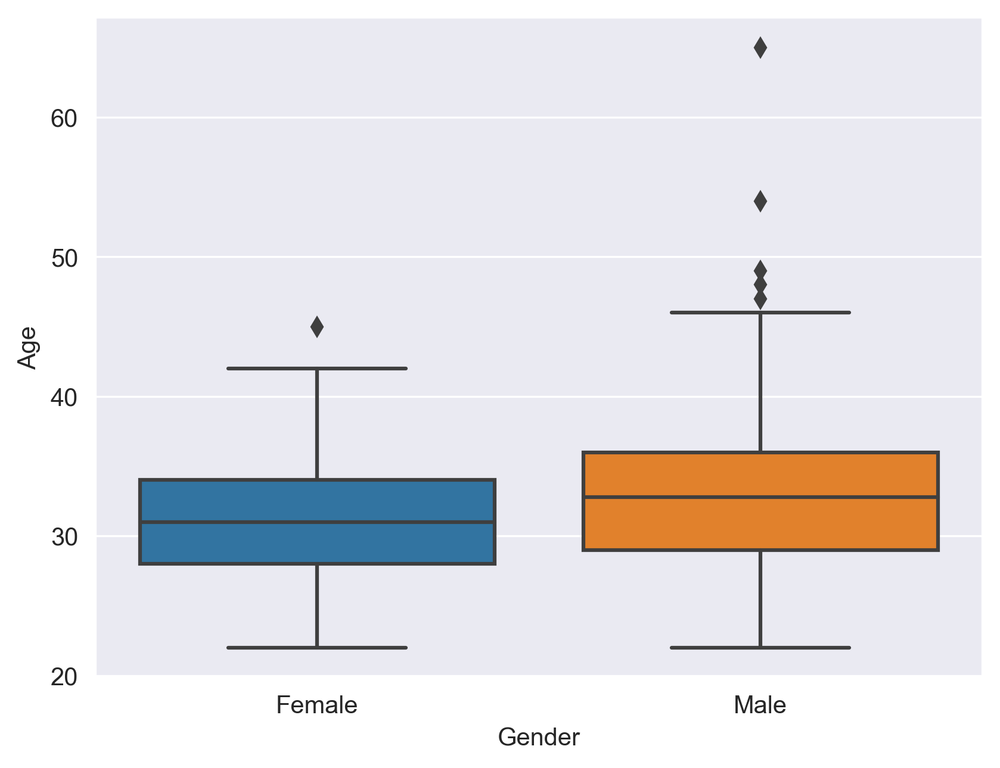

In [602]:
ax = sns.boxplot(data=dataset, x="Gender", y="Age")
fig = ax.get_figure()
fig.savefig(f"img/clean-boxplot-Gender-Age.png", bbox_inches='tight')


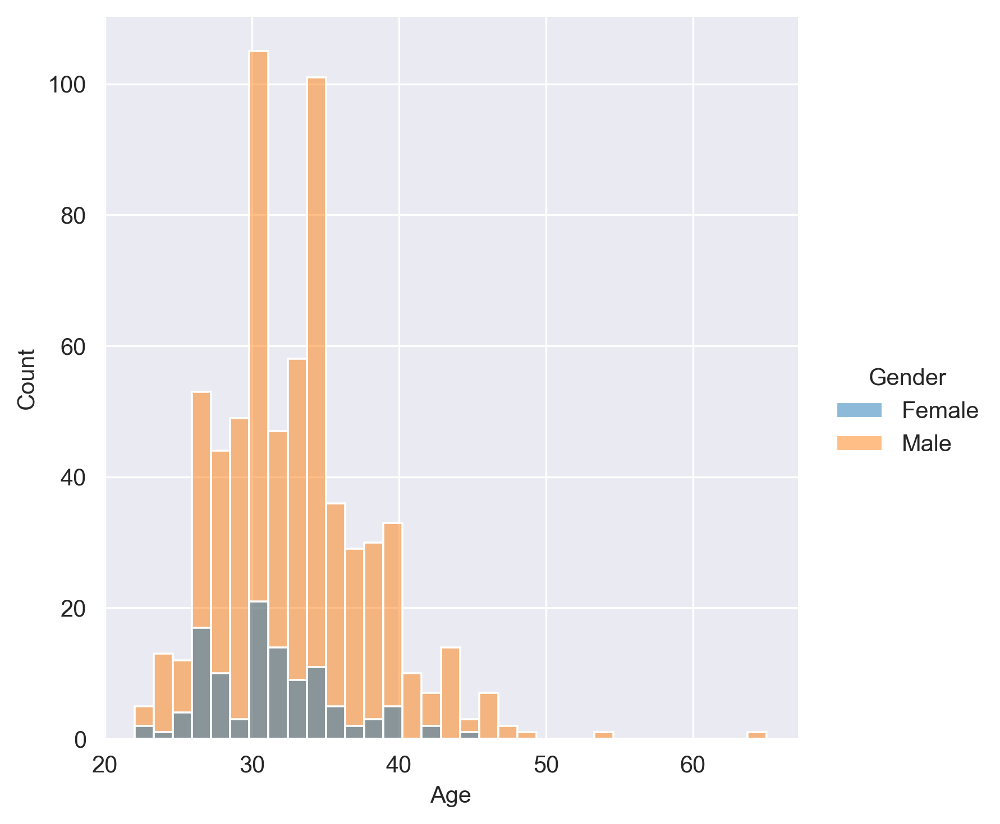

In [603]:
ax = sns.displot(data=dataset, kind="hist", x="Age", hue="Gender")
fig = ax.fig
fig.savefig(f"img/clean-displot-Age-Gender.png", bbox_inches='tight')


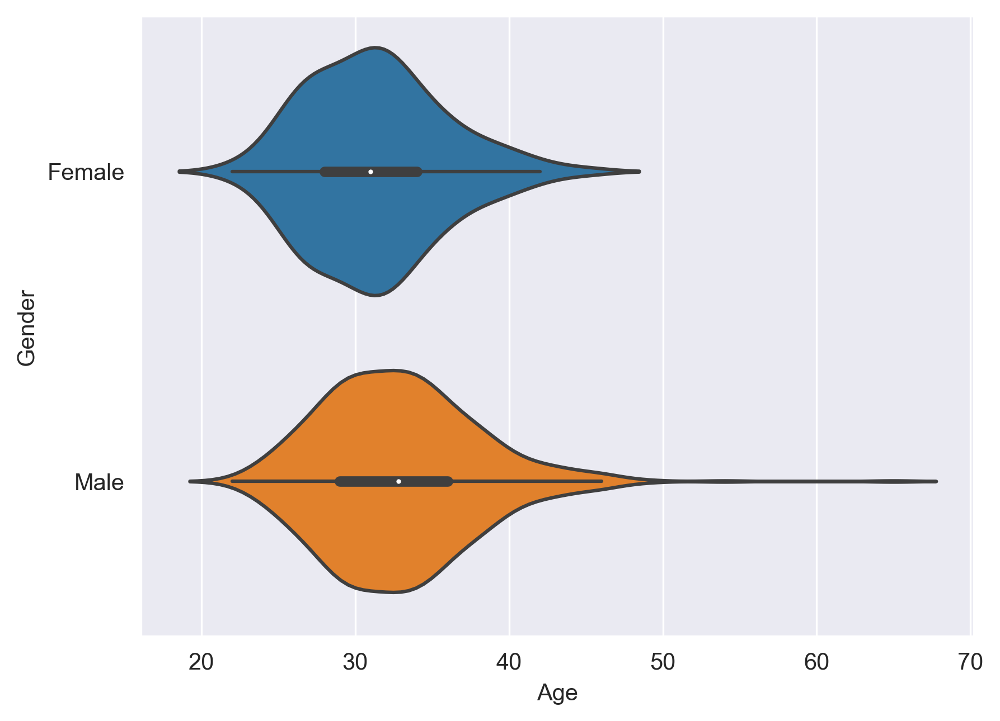

In [604]:
ax = sns.violinplot(data=dataset, x="Age", y="Gender")
fig = ax.get_figure()
fig.savefig(f"img/clean-violinplot-Age-Gender.png", bbox_inches='tight')


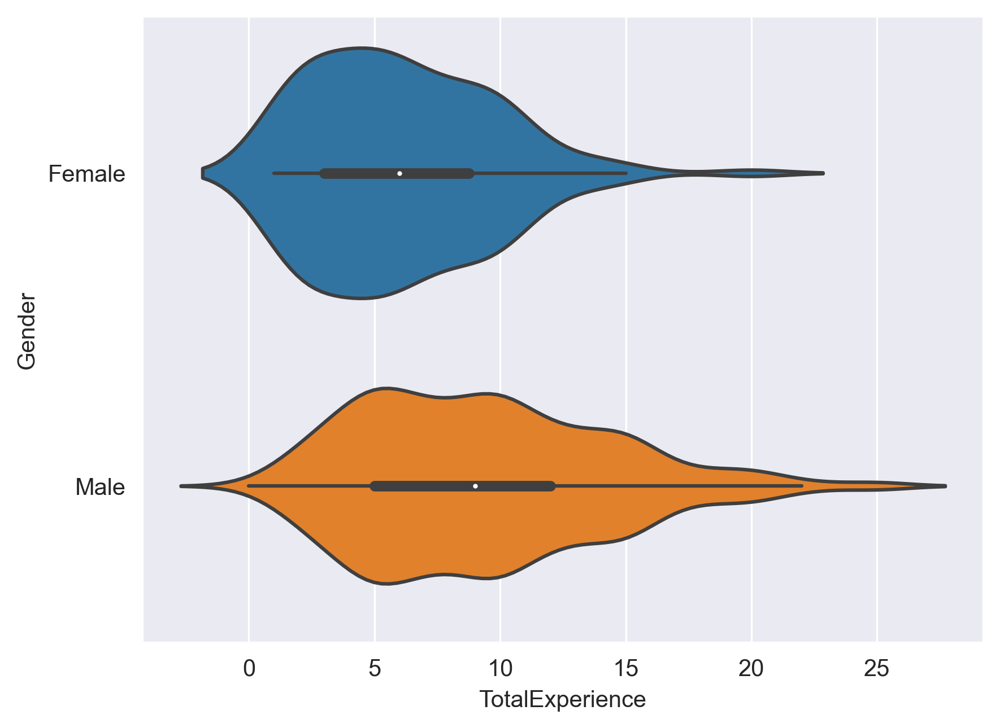

In [605]:
ax = sns.violinplot(data=dataset, x="TotalExperience", y="Gender")
fig = ax.get_figure()
fig.savefig(f"img/clean-violinplot-TotalExperience-Gender.png", bbox_inches='tight')


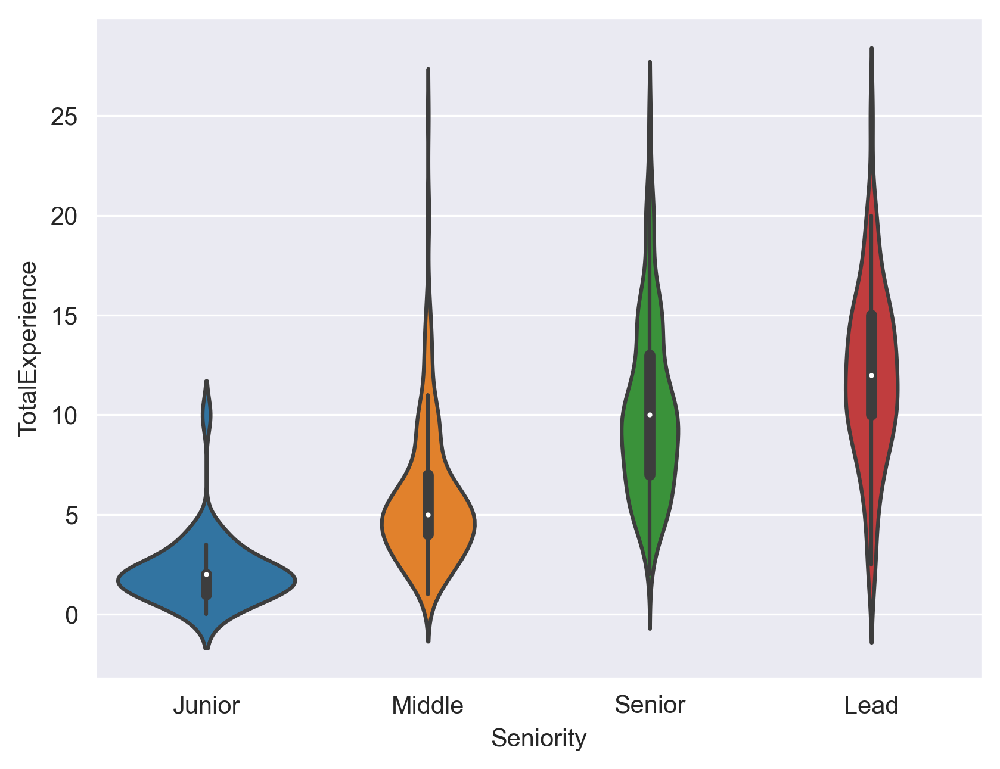

In [606]:
ax = sns.violinplot(data=dataset, y="TotalExperience", x="Seniority", order=["Junior", "Middle", "Senior", "Lead"])
fig = ax.get_figure()
fig.savefig(f"img/clean-violinplot-TotalExperience-Seniority.png", bbox_inches='tight')


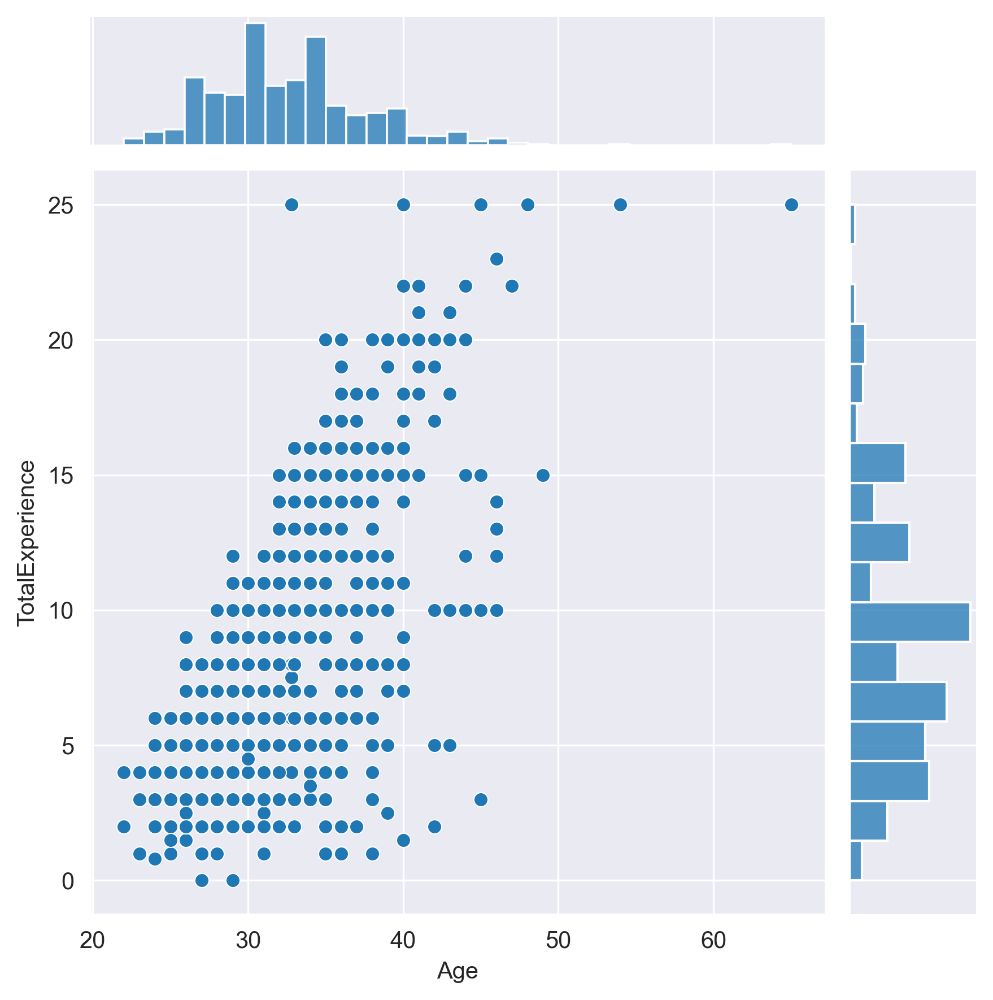

In [607]:
ax = sns.jointplot(data=dataset, x="Age", y="TotalExperience")
fig = ax.fig
fig.savefig(f"img/clean-jointplot-TotalExperience.png", bbox_inches='tight')


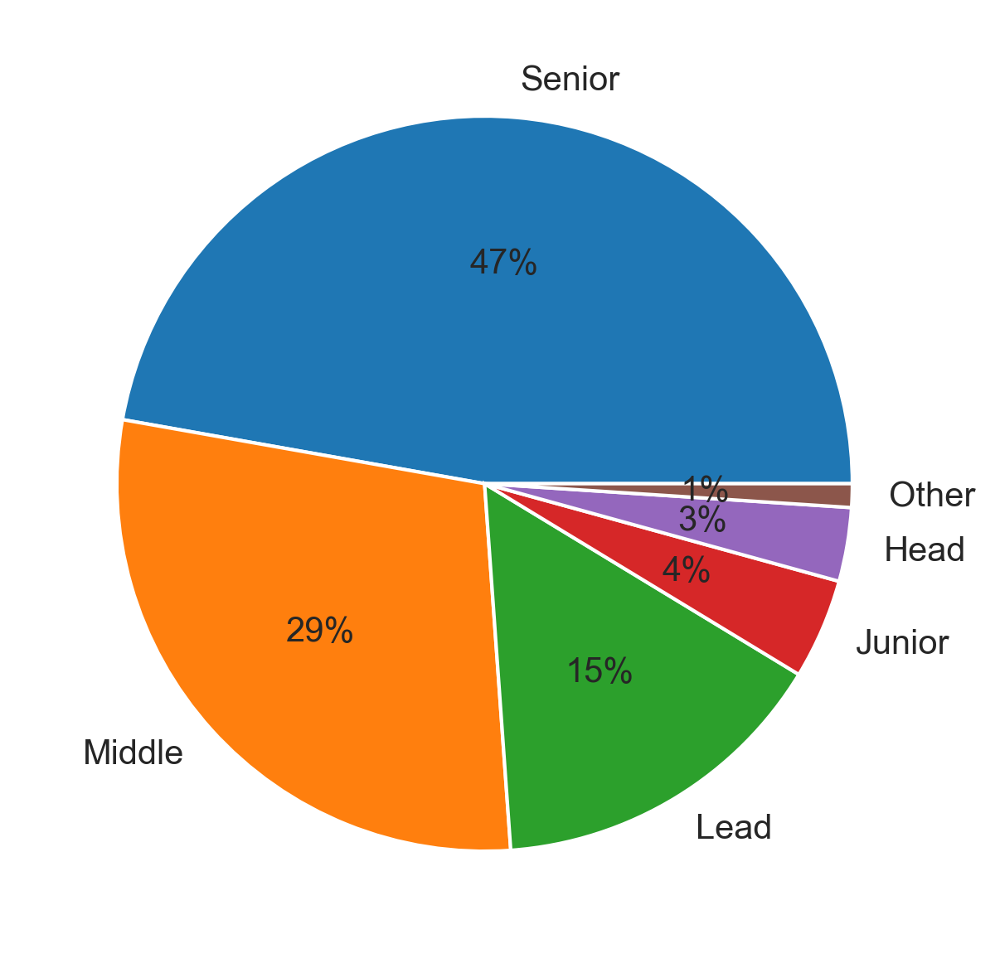

In [608]:
seniority = dataset['Seniority'].value_counts().reset_index()
BOUNDARY = 12
seniority_top = seniority[seniority["Seniority"] >= BOUNDARY].copy()
seniority_other = seniority[seniority["Seniority"] < BOUNDARY]["Seniority"].sum()
seniority_top.loc[len(seniority_top)] = ["Other", seniority_other]
seniority_top.set_index(keys=["index"], inplace=True)
ax = seniority_top["Seniority"].plot.pie(autopct="%1.0f%%")
fig = ax.get_figure()
ax.yaxis.set_visible(False)
fig.savefig(f"img/clean-pieplot-Seniority.png", bbox_inches='tight')


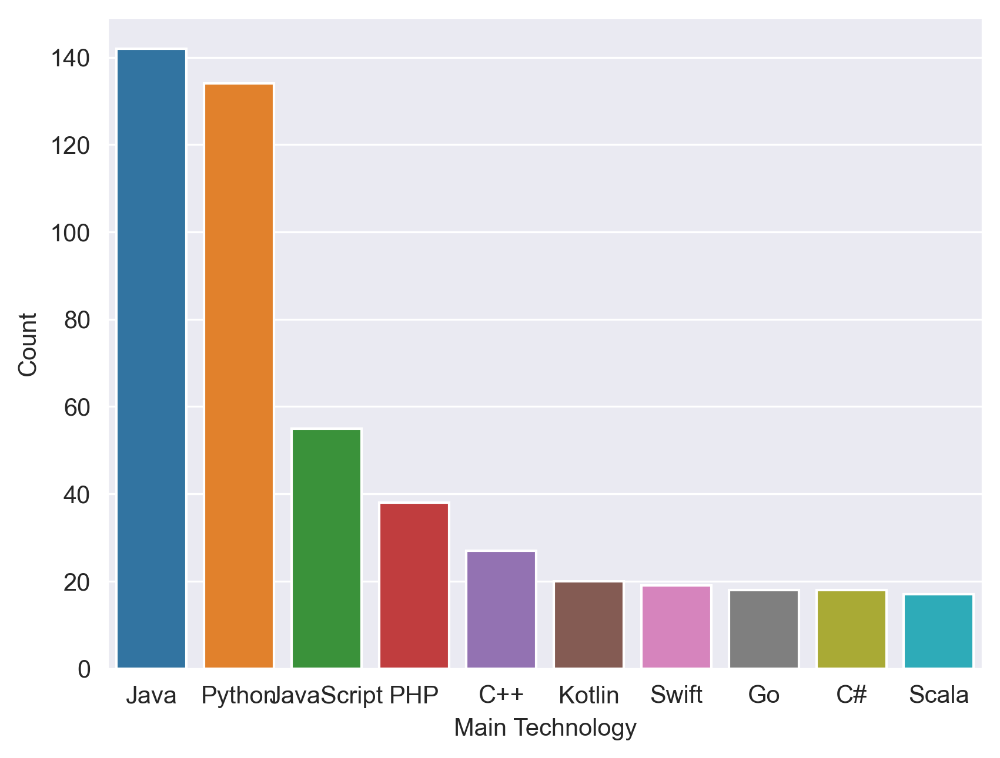

In [609]:
# Top technologies
technologies = dataset["MainTechnology"].value_counts()[:10].reset_index()
plot = sns.barplot(technologies, x="index", y="MainTechnology")
plot.set_xlabel("Main Technology")
plot.set_ylabel("Count")
ax = plot
fig = ax.get_figure()
fig.savefig(f"img/clean-barplot-MainTechnology.png", bbox_inches='tight')


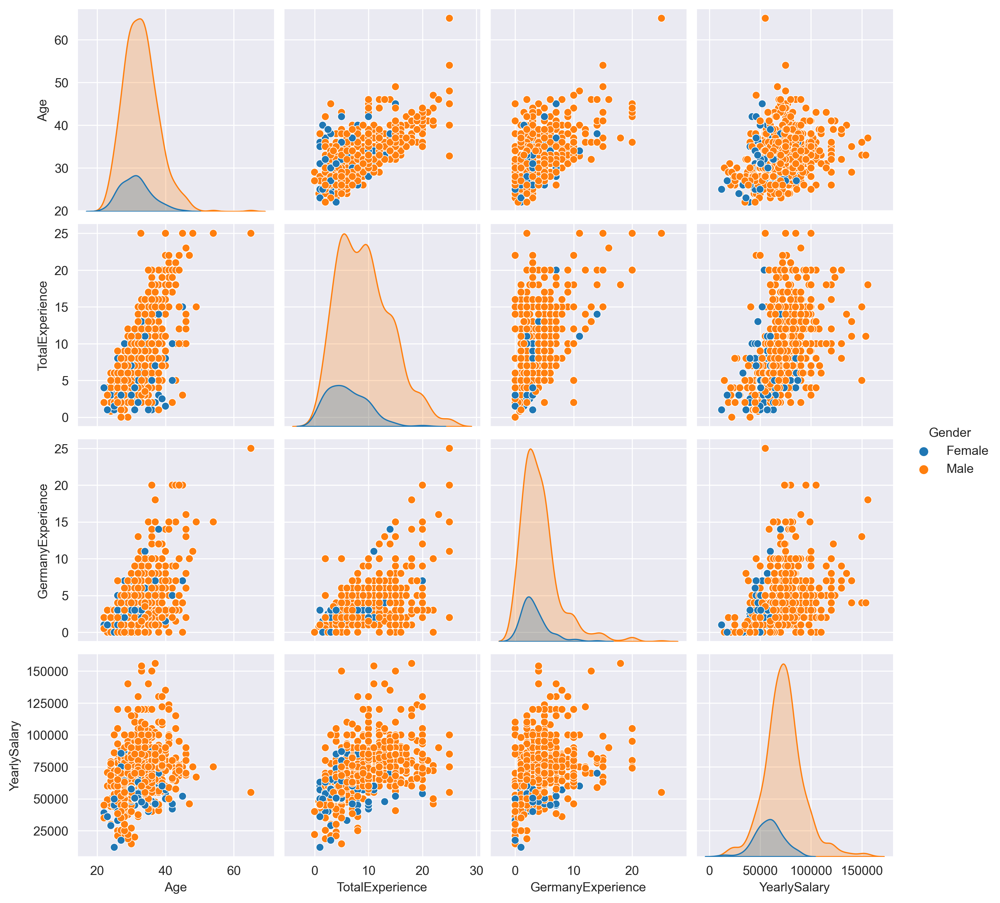

In [610]:
ax = sns.pairplot(dataset[["Age", "TotalExperience", "GermanyExperience", "YearlySalary", "Gender"]], hue="Gender")
fig = ax.fig
fig.savefig(f"img/clean-pairplot-correlation.png", bbox_inches='tight')


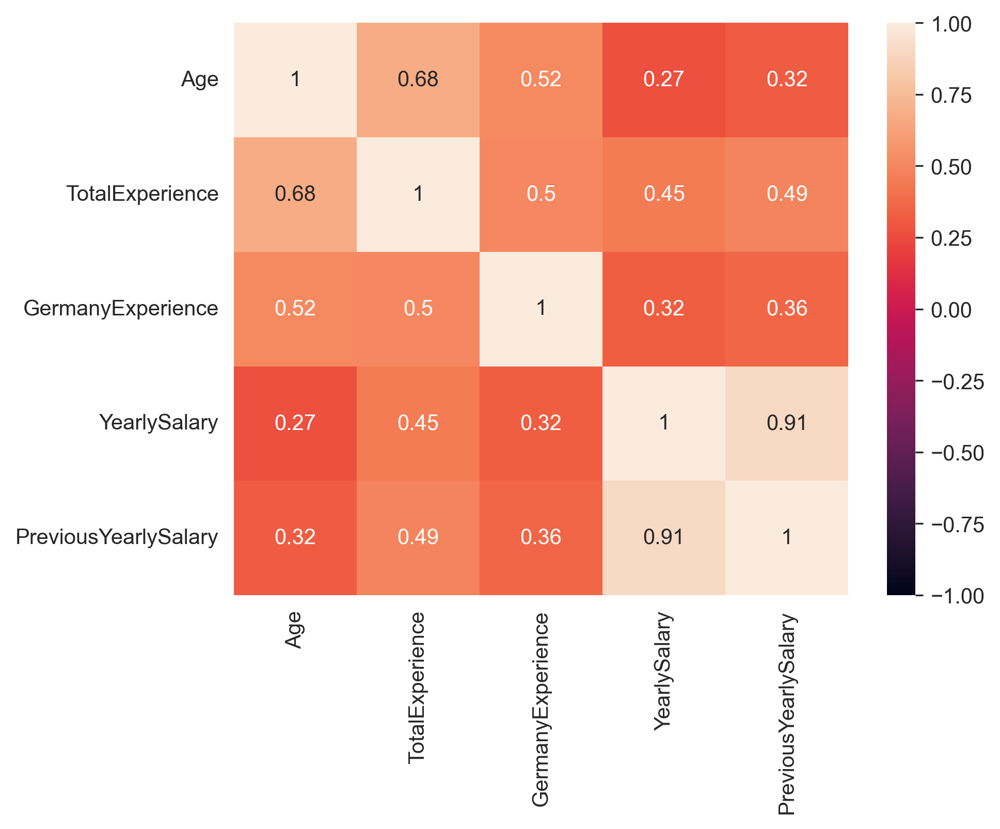

In [611]:
heatmap_data = dataset.loc[:, dataset.columns!="year"]
ax = sns.heatmap(heatmap_data.corr(numeric_only=True), vmin=-1, vmax=1, annot=True)
fig = ax.get_figure()
fig.savefig(f"img/clean-heatmap.png", bbox_inches='tight')


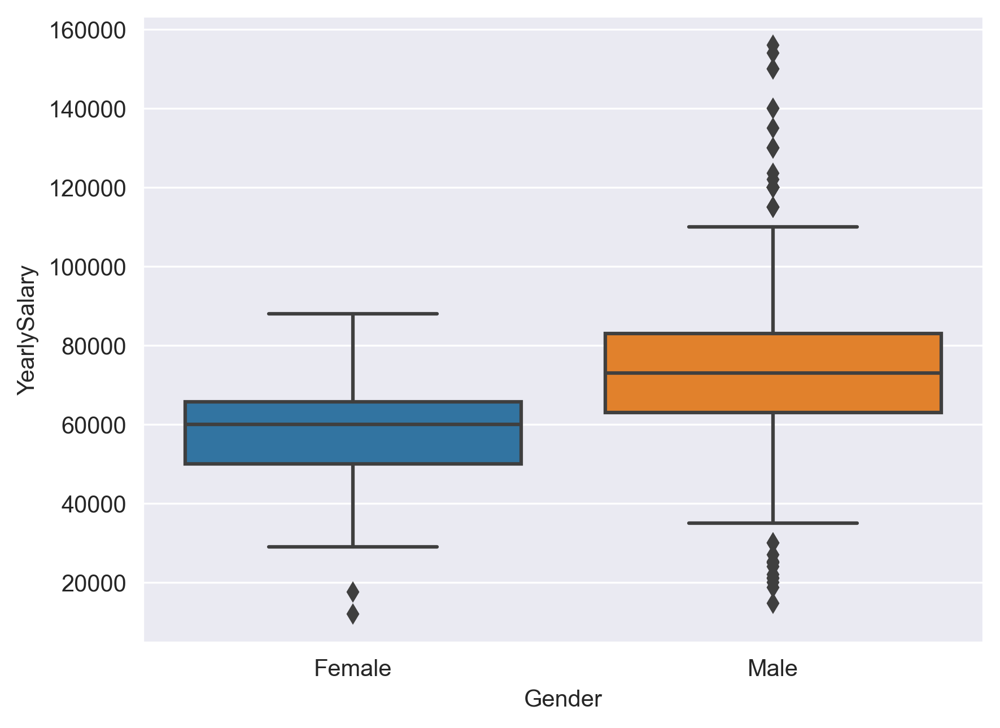

In [612]:
ax = sns.boxplot(data=dataset, x="Gender", y="YearlySalary")
fig = ax.get_figure()
fig.savefig(f"img/clean-boxplot-Gender-YearlySalary.png", bbox_inches='tight')


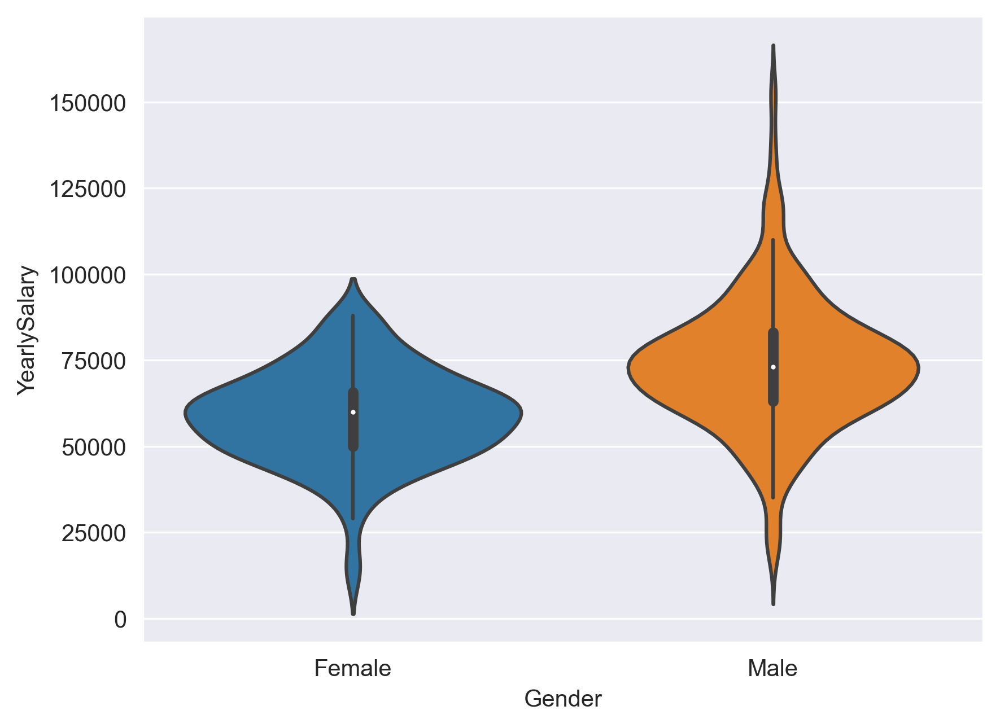

In [613]:
ax = sns.violinplot(data=dataset, x="Gender", y="YearlySalary")
fig = ax.get_figure()
fig.savefig(f"img/clean-violinplot-Gender-YearlySalary.png", bbox_inches='tight')


### Diskretizace numerických atributů

In [614]:
dataset_cat = dataset.copy()
dataset_cat["Age"] = pd.cut(dataset_cat["Age"], bins=10)
dataset_cat["TotalExperience"] = pd.cut(dataset_cat["TotalExperience"], bins=10)
dataset_cat["GermanyExperience"] = pd.cut(dataset_cat["GermanyExperience"], bins=10)
dataset_cat["YearlySalary"] = pd.cut(dataset_cat["YearlySalary"], bins=50)
dataset_cat["PreviousYearlySalary"] = pd.cut(dataset_cat["PreviousYearlySalary"], bins=50)
dataset_cat.to_csv('dataset_cat.csv')
dataset_cat.describe()


,Age,Gender,City,Position,TotalExperience,GermanyExperience,Seniority,MainTechnology,YearlySalary,PreviousYearlySalary,EmploymentStatus,CompanySize,CompanyType
count,771,771,771,771,771,771,771,771,771,771,771,771,771
unique,9,2,81,93,10,9,8,172,43,41,5,5,42
top,"(30.6, 34.9]",Male,Berlin,Software Engineer,"(7.5, 10.0]","(2.5, 5.0]",Senior,Java,"(72480.0, 75360.0]","(63200.0, 66100.0]",Full-time employee,1000+,Product
freq,243,661,431,267,190,333,364,142,75,86,749,293,500


### Transformace kategorických na numerické

In [615]:
dataset_num = dataset.copy()

# Transformation of categorical values to numeric values.

# Sort with a set ordering.
dataset_num["CompanySize"] = dataset_num["CompanySize"].replace({"up to 10": 0, "11-50": 1, "51-100": 2, "101-1000": 3, "1000+": 4}).astype(int)

# It is not possible to sensibly sort the following column values into any reasonable order. Therefore, only a simple factorization can be applied.
dataset_num["Seniority"] = pd.factorize(dataset_num["Seniority"])[0]
dataset_num["EmploymentStatus"] = pd.factorize(dataset_num["EmploymentStatus"])[0]
dataset_num["CompanyType"] = pd.factorize(dataset_num["CompanyType"])[0]
dataset_num["City"] = pd.factorize(dataset_num["City"])[0]
dataset_num["Position"] = pd.factorize(dataset_num["Position"])[0]
dataset_num["MainTechnology"] = pd.factorize(dataset_num["MainTechnology"])[0]
dataset_num["Gender"] = pd.factorize(dataset_num["Gender"])[0]

# Normalization of numeric values.
# Z-score normalization of selected columns with ordered values.
cols = ["Age", 'TotalExperience', 'GermanyExperience', "YearlySalary", "PreviousYearlySalary", "CompanySize"]
dataset_num[cols] = preprocessing.StandardScaler().fit_transform(dataset_num[cols])

dataset_num.to_csv('dataset_num.csv')
dataset_num

,Age,Gender,City,Position,TotalExperience,GermanyExperience,Seniority,MainTechnology,YearlySalary,PreviousYearlySalary,EmploymentStatus,CompanySize,CompanyType
0,-1.329124,0,0,0,-0.787641,-0.340599,0,0,0.442317,0.531095,0,-0.762691,0
1,-1.329124,0,1,1,-0.381820,-0.034679,0,1,0.442317,0.913920,0,0.097009,0
2,-0.728770,0,1,0,0.632734,0.577162,1,2,2.506868,1.898325,1,0.097009,0
4,0.872174,0,1,1,1.647289,0.577162,0,3,-0.486731,-0.179864,0,0.097009,0
5,-0.128416,0,1,2,-0.787641,-0.952440,0,4,0.235862,0.585785,0,-1.622391,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1248,-0.328534,0,1,1,0.024002,0.271242,0,6,-0.073821,0.257649,0,-0.762691,0
1249,0.071702,0,1,91,0.226913,-0.799480,0,170,-0.589959,-0.945513,0,0.956709,0
1250,1.272409,0,0,92,1.241467,-0.646520,1,5,1.990730,1.351433,0,0.097009,41
1251,-1.329124,0,80,3,-0.381820,0.883083,3,17,-1.707397,-1.722099,0,0.097009,0
